## **Business Context – Credit Card Approval Prediction**

### **Latar Belakang**
Perusahaan kartu kredit harus menentukan apakah calon nasabah layak diberikan kartu kredit atau tidak. Keputusan ini memiliki dampak finansial besar:

- Jika **menyetujui nasabah berisiko tinggi**, perusahaan bisa mengalami kerugian (default loss).  
- Jika **menolak nasabah yang sebenarnya baik**, perusahaan kehilangan peluang pendapatan (opportunity cost).

Perusahaan saat ini lebih memprioritaskan **keamanan finansial**. Artinya:
> Lebih baik sedikit menolak nasabah baik daripada menerima nasabah yang berpotensi gagal bayar.

---

### **Masalah Data**

Dataset berasal dari dua sumber:

#### **1. Application Data (application_record.csv)**  
Berisi informasi calon nasabah: demografi, pendapatan, pekerjaan, status keluarga, dan kepemilikan sarana komunikasi.

Contoh fitur:
- ID: Nomor unik nasabah  
- CODE_GENDER: Jenis kelamin  
- AMT_INCOME_TOTAL: Pendapatan tahunan  
- DAYS_BIRTH: Umur (hitung mundur dari hari ini)  
- OCCUPATION_TYPE: Jenis pekerjaan  
- FLAG_MOBIL / PHONE / EMAIL: Kepemilikan sarana komunikasi

### **Permasalahan Bisnis**
Fokus perusahaan adalah **mendeteksi calon nasabah berisiko tinggi gagal bayar**.

**Prioritas utama:**  
→ Minimalkan risiko gagal bayar.

Artinya:
- Perusahaan rela **menolak nasabah baik** (false positive)  
- Daripada **menyetujui nasabah buruk** (false negative)

**Trade-off:**
- Precision turun  
- Recall naik (lebih banyak Bad terdeteksi)  
- Keputusan tetap harus mendukung pertumbuhan bisnis dengan kontrol risiko ketat.

---

### **Kondisi Perusahaan**
- Riwayat menunjukkan risiko gagal bayar stabil.  
- Namun perusahaan semakin selektif karena kondisi finansial & regulasi internal.  
- Strategi approval lebih konservatif:
  - Fokus keamanan finansial  
  - Tetap membuka kesempatan nasabah baru, tetapi dengan filter risiko lebih ketat  

---


# A. import packages

In [168]:
import warnings
warnings.filterwarnings("ignore")
import os

os.makedirs("dataset", exist_ok=True)
import numpy as np
import pandas as pd
import scipy.stats as stats
import missingno as msno
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter

from ydata_profiling import ProfileReport

from pathlib import Path
from scipy.stats import probplot, chi2_contingency, chi2
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.calibration import CalibratedClassifierCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, roc_curve, roc_auc_score, auc
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, cross_val_predict
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.inspection import permutation_importance
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import OrdinalEncoder
from sklearn.metrics import make_scorer, recall_score
from yellowbrick.model_selection import FeatureImportances
from scipy.stats import randint, uniform

import joblib
import os
%matplotlib inline
print("✨ Environment ready — all dependencies loaded")

✨ Environment ready — all dependencies loaded


# B. Get the data

## B.1 import csv file

In [2]:
cc_data_full_data = pd.read_csv(r"D:/Final Project Data Science/DATASET/application_record.csv")
credit_status = pd.read_csv(r"D:/Final Project Data Science/DATASET/credit_record.csv")

## B.2 creating the target variable

In [3]:
begin_month=pd.DataFrame(credit_status.groupby(['ID'])['MONTHS_BALANCE'].agg(min))
begin_month=begin_month.rename(columns={'MONTHS_BALANCE':'Account age'})
cc_data_full_data=pd.merge(cc_data_full_data,begin_month,how='left',on='ID')
credit_status['dep_value'] = None
credit_status['dep_value'][credit_status['STATUS'] =='2']='Yes'
credit_status['dep_value'][credit_status['STATUS'] =='3']='Yes'
credit_status['dep_value'][credit_status['STATUS'] =='4']='Yes'
credit_status['dep_value'][credit_status['STATUS'] =='5']='Yes'
cpunt=credit_status.groupby('ID').count()
cpunt['dep_value'][cpunt['dep_value'] > 0]='Yes'
cpunt['dep_value'][cpunt['dep_value'] == 0]='No'
cpunt = cpunt[['dep_value']]
cc_data_full_data = pd.merge(cc_data_full_data,cpunt,how='inner',on='ID')
cc_data_full_data['Is high risk']=cc_data_full_data['dep_value']
cc_data_full_data.loc[cc_data_full_data['Is high risk']=='Yes','Is high risk']=1
cc_data_full_data.loc[cc_data_full_data['Is high risk']=='No','Is high risk']=0
cc_data_full_data.drop('dep_value',axis=1,inplace=True)
pd.options.mode.chained_assignment = None # hide warning SettingWithCopyWarning

## B.3 Rename features

In [4]:
# rename the features to a more readable feature names
cc_data_full_data = cc_data_full_data.rename(columns={
    'CODE_GENDER':'Gender',
    'FLAG_OWN_CAR':'Has a car',
    'FLAG_OWN_REALTY':'Has a property',
    'CNT_CHILDREN':'Children count',
    'AMT_INCOME_TOTAL':'Income',
    'NAME_INCOME_TYPE':'Employment status',
    'NAME_EDUCATION_TYPE':'Education level',
    'NAME_FAMILY_STATUS':'Marital status',
    'NAME_HOUSING_TYPE':'Dwelling',
    'DAYS_BIRTH':'Age',
    'DAYS_EMPLOYED': 'Employment length',
    'FLAG_MOBIL': 'Has a mobile phone',
    'FLAG_WORK_PHONE': 'Has a work phone',
    'FLAG_PHONE': 'Has a phone',
    'FLAG_EMAIL': 'Has an email',
    'OCCUPATION_TYPE': 'Job title',
    'CNT_FAM_MEMBERS': 'Family member count',
    'Account age': 'Account age'
    })

## B.4 Split the data into training and test sets, creating a copy of the datasets

In [5]:
# split the data into train and test
def data_split(df, test_size):
    train_df, test_df = train_test_split(df, test_size=test_size, random_state=42)
    return train_df.reset_index(drop=True), test_df.reset_index(drop=True)

In [6]:
cc_train_original, cc_test_original = data_split(cc_data_full_data, 0.2)

In [7]:
cc_train_original.shape

(29165, 20)

In [8]:
cc_test_original.shape

(7292, 20)

In [9]:
cc_train_original.to_csv('dataset/train.csv',index=False)

In [10]:
cc_test_original.to_csv('dataset/test.csv',index=False)

In [11]:
# creating a copy of the dataset so that the original stays untouched
cc_train_copy = cc_train_original.copy()
cc_test_copy = cc_test_original.copy()

# C. Explore the Data

## C.0 Pandas Profiling

In [169]:
profile_report = ProfileReport(cc_train_copy, explorative=True)
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 20/20 [00:00<00:00, 367.51it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## C.1 Quick glance at the data

In [13]:
cc_data_full_data.head()

,ID,Gender,Has a car,Has a property,Children count,Income,Employment status,Education level,Marital status,Dwelling,Age,Employment length,Has a mobile phone,Has a work phone,Has a phone,Has an email,Job title,Family member count,Account age,Is high risk
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,-15.0,0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,-14.0,0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,-29.0,0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,-4.0,0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,-26.0,0


In [14]:
cc_data_full_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   36457 non-null  int64  
 1   Gender               36457 non-null  object 
 2   Has a car            36457 non-null  object 
 3   Has a property       36457 non-null  object 
 4   Children count       36457 non-null  int64  
 5   Income               36457 non-null  float64
 6   Employment status    36457 non-null  object 
 7   Education level      36457 non-null  object 
 8   Marital status       36457 non-null  object 
 9   Dwelling             36457 non-null  object 
 10  Age                  36457 non-null  int64  
 11  Employment length    36457 non-null  int64  
 12  Has a mobile phone   36457 non-null  int64  
 13  Has a work phone     36457 non-null  int64  
 14  Has a phone          36457 non-null  int64  
 15  Has an email         36457 non-null 

In [15]:
cc_data_full_data.describe()

,ID,Children count,Income,Age,Employment length,Has a mobile phone,Has a work phone,Has a phone,Has an email,Family member count,Account age
count,3.645700e+04,36457.000000,3.645700e+04,36457.000000,36457.000000,36457.0,36457.000000,36457.000000,36457.000000,36457.000000,36457.000000
mean,5.078227e+06,0.430315,1.866857e+05,-15975.173382,59262.935568,1.0,0.225526,0.294813,0.089722,2.198453,-26.164193
std,4.187524e+04,0.742367,1.017892e+05,4200.549944,137651.334859,0.0,0.417934,0.455965,0.285787,0.911686,16.501854
min,5.008804e+06,0.000000,2.700000e+04,-25152.000000,-15713.000000,1.0,0.000000,0.000000,0.000000,1.000000,-60.000000
25%,5.042028e+06,0.000000,1.215000e+05,-19438.000000,-3153.000000,1.0,0.000000,0.000000,0.000000,2.000000,-39.000000
50%,5.074614e+06,0.000000,1.575000e+05,-15563.000000,-1552.000000,1.0,0.000000,0.000000,0.000000,2.000000,-24.000000
75%,5.115396e+06,1.000000,2.250000e+05,-12462.000000,-408.000000,1.0,0.000000,1.000000,0.000000,3.000000,-12.000000
max,5.150487e+06,19.000000,1.575000e+06,-7489.000000,365243.000000,1.0,1.000000,1.000000,1.000000,20.000000,0.000000


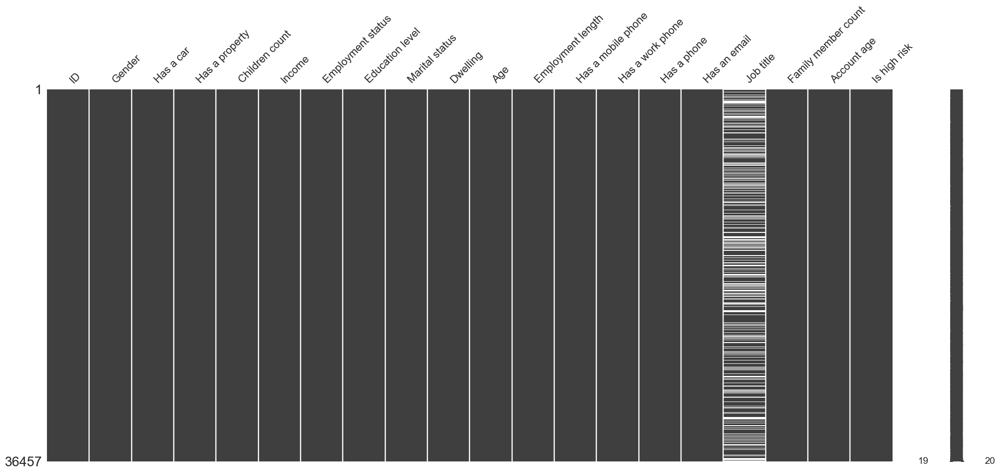

In [16]:
msno.matrix(cc_data_full_data)
plt.show()

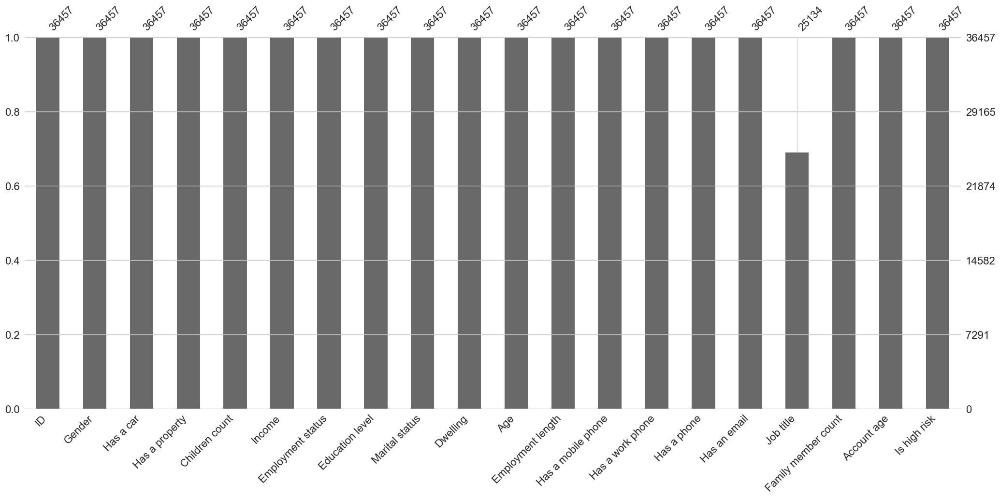

In [17]:
msno.bar(cc_data_full_data)
plt.show()

## C.2 Functions used to explore each feature

In [18]:
#Function that will return the value count and frequency of each observation within a feature
def value_cnt_norm_cal(df,feature):
    ftr_value_cnt = df[feature].value_counts()
    ftr_value_cnt_norm = df[feature].value_counts(normalize=True) * 100
    ftr_value_cnt_concat = pd.concat([ftr_value_cnt, ftr_value_cnt_norm], axis=1)
    ftr_value_cnt_concat.columns = ['Count', 'Frequency (%)']
    return ftr_value_cnt_concat

In [19]:
# function to create display general information about the feature
def gen_info_feat(df,feature):
    match feature:
        case 'Age':
            # change the feature to be express in positive numbers days
            print('Description:\n{}'.format((np.abs(df[feature])/365.25).describe()))
            print('*'*50)
            print('Object type:{}'.format(df[feature].dtype))
        case 'Employment length':
            # select only the rows where the rows are negative to ignore whose who have retired or unemployed
            employment_len_no_ret = cc_train_copy['Employment length'][cc_train_copy['Employment length'] < 0]
            employment_len_no_ret_yrs = np.abs(employment_len_no_ret)/365.25
            print('Description:\n{}'.format((employment_len_no_ret_yrs).describe()))
            print('*'*50)
            print('Object type:{}'.format(employment_len_no_ret.dtype))
        case 'Account age':
            # change the account age to a positive number of months
            print('Description:\n{}'.format((np.abs(df[feature])).describe()))
            print('*'*50)
            print('Object type:{}'.format(df[feature].dtype))
        case _:
            print('Description:\n{}'.format(df[feature].describe()))
            print('*'*50)
            print('Object type:\n{}'.format(df[feature].dtype))
            print('*'*50)
            value_cnt = value_cnt_norm_cal(df,feature)
            print('Value count:\n{}'.format(value_cnt))


In [20]:
# function to create a pie chart plot
def create_pie_plot(df,feature):
    match feature:
        case 'Dwelling' | 'Education level':
            ratio_size = value_cnt_norm_cal(df, feature)
            ratio_size_len = len(ratio_size.index)
            ratio_list = []
            for i in range(ratio_size_len):
                ratio_list.append(ratio_size.iloc[i]['Frequency (%)'])
            fig, ax = plt.subplots(figsize=(8,8))
            # %1.2f%% display decimals in the pie chart with 2 decimal places
            plt.pie(ratio_list, startangle=90, wedgeprops={'edgecolor' :'black'})
            plt.title('Pie chart of {}'.format(feature))
            plt.legend(loc='best',labels=ratio_size.index)
            plt.axis('equal')
            return plt.show()
        case _:
            ratio_size = value_cnt_norm_cal(df, feature)
            ratio_size_len = len(ratio_size.index)
            ratio_list = []
            for i in range(ratio_size_len):
                ratio_list.append(ratio_size.iloc[i]['Frequency (%)'])
            fig, ax = plt.subplots(figsize=(8,8))
            # %1.2f%% display decimals in the pie chart with 2 decimal places
            plt.pie(ratio_list, labels=ratio_size.index, autopct='%1.2f%%', startangle=90, wedgeprops={'edgecolor' :'black'})
            plt.title('Pie chart of {}'.format(feature))
            plt.legend(loc='best')
            plt.axis('equal')
            return plt.show()

In [21]:
# function to create a bar chart plot
def create_bar_plot(df,feature):
    match feature:
        case 'Marital status' | 'Dwelling' | 'Job title' | 'Employment status' | 'Education level':
            fig, ax = plt.subplots(figsize=(6,10))
            sns.barplot(x=value_cnt_norm_cal(df,feature).index,y=value_cnt_norm_cal(df,feature).values[:,0])
            ax.set_xticklabels(labels=value_cnt_norm_cal(df,feature).index,rotation=45,ha='right')
            plt.xlabel('{}'.format(feature))
            plt.ylabel('Count')
            plt.title('{} count'.format(feature))
            return plt.show()
        case _:
            fig, ax = plt.subplots(figsize=(6,10))
            sns.barplot(x=value_cnt_norm_cal(df,feature).index,y=value_cnt_norm_cal(df,feature).values[:,0])
            plt.xlabel('{}'.format(feature))
            plt.ylabel('Count')
            plt.title('{} count'.format(feature))
            return plt.show()

In [22]:
# function to create a box plot
def create_box_plot(df,feature):
    match feature:
        case 'Age':
            fig, ax = plt.subplots(figsize=(2,8))
            # change the feature to be express in positive numbers days
            sns.boxplot(y=np.abs(df[feature])/365.25)
            plt.title('{} distribution(Boxplot)'.format(feature))
            return plt.show()
        case 'Children count':
            fig, ax = plt.subplots(figsize=(2,8))
            sns.boxplot(y=df[feature])
            plt.title('{} distribution(Boxplot)'.format(feature))
            plt.yticks(np.arange(0,df[feature].max(),1))
            return plt.show()
        case 'Employment length':
            fig, ax = plt.subplots(figsize=(2,8))
            employment_len_no_ret = cc_train_copy['Employment length'][cc_train_copy['Employment length'] < 0]
            # employement length in days is a negative number so we need to change it to positive and change it to days
            employment_len_no_ret_yrs = np.abs(employment_len_no_ret)/365.25
            sns.boxplot(y=employment_len_no_ret_yrs)
            plt.title('{} distribution(Boxplot)'.format(feature))
            plt.yticks(np.arange(0,employment_len_no_ret_yrs.max(),2))
            return plt.show()
        case 'Income':
            fig, ax = plt.subplots(figsize=(2,8))
            sns.boxplot(y=df[feature])
            plt.title('{} distribution(Boxplot)'.format(feature))
            # suppress scientific notation
            ax.get_yaxis().set_major_formatter(
                matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
            return plt.show()
        case 'Account age':
            fig, ax = plt.subplots(figsize=(2,8))
            sns.boxplot(y=np.abs(df[feature]))
            plt.title('{} distribution(Boxplot)'.format(feature))
            return plt.show()
        case _:
            fig, ax = plt.subplots(figsize=(2,8))
            sns.boxplot(y=df[feature])
            plt.title('{} distribution(Boxplot)'.format(feature))
            return plt.show()

In [23]:
# function to create a histogram plot
def create_hist_plot(df,feature, the_bins=50):
    match feature:
        case 'Age':
            fig, ax = plt.subplots(figsize=(18,10))
            # change the feature to be express in positive numbers days
            sns.histplot(np.abs(df[feature])/365.25,bins=the_bins,kde=True)
            plt.title('{} distribution'.format(feature))
            return plt.show()
        case 'Income':
            fig, ax = plt.subplots(figsize=(18,10))
            sns.histplot(df[feature],bins=the_bins,kde=True)
            # suppress scientific notation
            ax.get_xaxis().set_major_formatter(
                matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
            plt.title('{} distribution'.format(feature))
            return plt.show()
        case 'Employment length':
            employment_len_no_ret = cc_train_copy['Employment length'][cc_train_copy['Employment length'] < 0]
            # change the feature to be express in positive numbers days
            employment_len_no_ret_yrs = np.abs(employment_len_no_ret)/365.25
            fig, ax = plt.subplots(figsize=(18,10))
            sns.histplot(employment_len_no_ret_yrs,bins=the_bins,kde=True)
            plt.title('{} distribution'.format(feature))
            return plt.show()
        case 'Account age':
            fig, ax = plt.subplots(figsize=(18,10))
            sns.histplot(np.abs(df[feature]),bins=the_bins,kde=True)
            plt.title('{} distribution'.format(feature))
            return plt.show()
        case _:
            fig, ax = plt.subplots(figsize=(18,10))
            sns.histplot(df[feature],bins=the_bins,kde=True)
            plt.title('{} distribution'.format(feature))
            return plt.show()

In [24]:
# High risk vs low risk applicants compared on a box plot
def low_high_risk_box_plot(df,feature):
    match feature:
        case 'Age':
            print(np.abs(df.groupby('Is high risk')[feature].mean()/365.25))
            fig, ax = plt.subplots(figsize=(5,8))
            sns.boxplot(y=np.abs(df[feature])/365.25,x=df['Is high risk'])
            plt.xticks(ticks=[0,1],labels=['no','yes'])
            plt.title('High risk individuals grouped by age')
            return plt.show()
        case 'Income':
            print(np.abs(df.groupby('Is high risk')[feature].mean()))
            fig, ax = plt.subplots(figsize=(5,8))
            sns.boxplot(y=np.abs(df[feature]),x=df['Is high risk'])
            plt.xticks(ticks=[0,1],labels=['no','yes'])
            # suppress scientific notation
            ax.get_yaxis().set_major_formatter(
                matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
            plt.title('High risk individuals grouped by {}'.format(feature))
            return plt.show()
        case 'Employment length':
            #checking is an applicant is high risk or not (for those who have negative employment length aka the employed ones)
            employment_no_ret = cc_train_copy['Employment length'][cc_train_copy['Employment length'] <0]
            employment_no_ret_idx = employment_no_ret.index
            employment_len_no_ret_yrs = np.abs(employment_no_ret)/365.25
            employment_no_ret_df = cc_train_copy.iloc[employment_no_ret_idx][['Employment length','Is high risk']]
            employment_no_ret_is_high_risk = employment_no_ret_df.groupby('Is high risk')['Employment length'].mean()
            # compare the age of high risk individuals with the age of low risk individuals (those who are employed)
            print(np.abs(employment_no_ret_is_high_risk)/365.25)
            fig, ax = plt.subplots(figsize=(5,8))
            sns.boxplot(y=employment_len_no_ret_yrs,x=df['Is high risk'])
            plt.xticks(ticks=[0,1],labels=['no','yes'])
            plt.title('High vs low risk individuals grouped by {}'.format(feature))
            return plt.show()
        case _:
            print(np.abs(df.groupby('Is high risk')[feature].mean()))
            fig, ax = plt.subplots(figsize=(5,8))
            sns.boxplot(y=np.abs(df[feature]),x=df['Is high risk'])
            plt.xticks(ticks=[0,1],labels=['no','yes'])
            plt.title('High risk individuals grouped by {}'.format(feature))
            return plt.show()

In [25]:
# High risk vs low risk applicants compared on a bar plot
def low_high_risk_bar_plot(df,feature):
    is_high_risk_grp = df.groupby(feature)['Is high risk'].sum()
    is_high_risk_grp_srt = is_high_risk_grp.sort_values(ascending=False)
    print(dict(is_high_risk_grp_srt))
    fig, ax = plt.subplots(figsize=(6,10))
    sns.barplot(x=is_high_risk_grp_srt.index,y=is_high_risk_grp_srt.values)
    ax.set_xticklabels(labels=is_high_risk_grp_srt.index,rotation=45, ha='right')
    plt.ylabel('Count')
    plt.title('High risk applicants count grouped by {}'.format(feature))
    return plt.show()

In [26]:
cc_train_copy.shape

(29165, 20)

## C.3 Univariate analysis

### C.3.1. Gender

In [27]:
gen_info_feat(cc_train_copy,'Gender')

Description:
count     29165
unique        2
top           F
freq      19549
Name: Gender, dtype: object
**************************************************
Object type:
object
**************************************************
Value count:
        Count  Frequency (%)
Gender                      
F       19549      67.028973
M        9616      32.971027


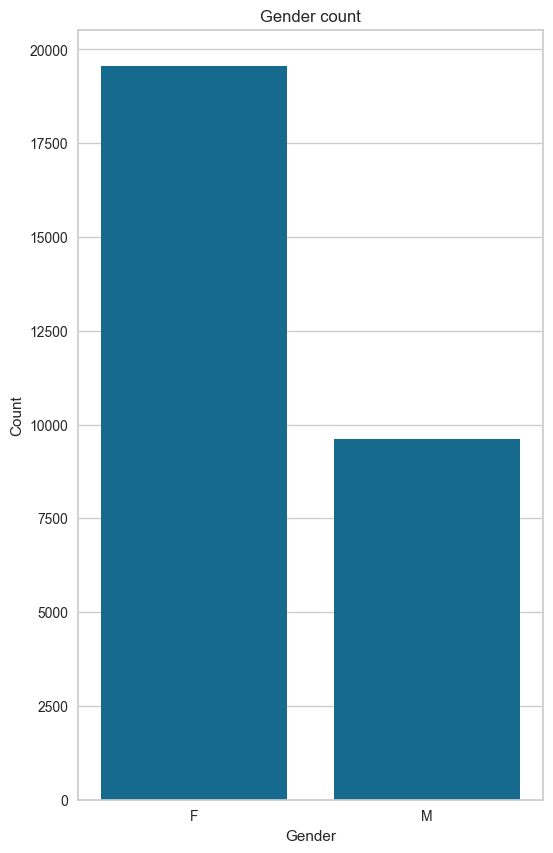

In [28]:
create_bar_plot(cc_train_copy,'Gender')

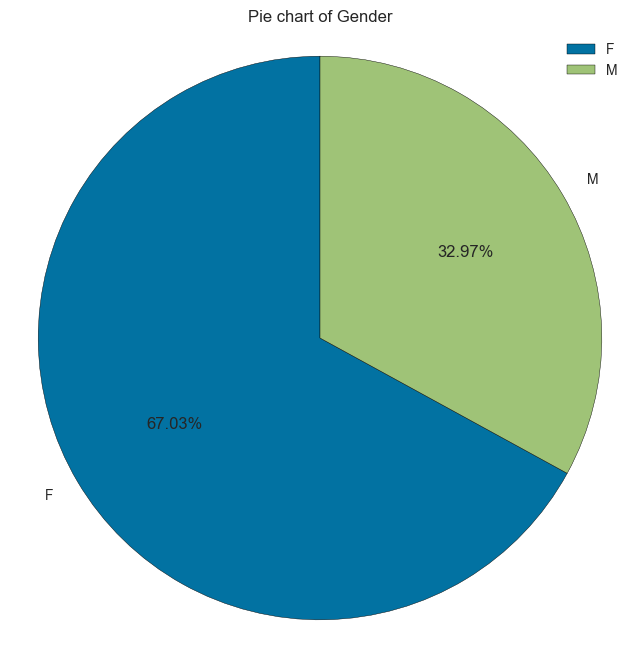

In [29]:
create_pie_plot(cc_train_copy,'Gender')

Interpretation:
- Jumlah nasabah perempuan lebih banyak dibandingkan nasabah laki-laki, sekitar 67% berbanding 32%.

### C.3.2 Age

In [30]:
gen_info_feat(cc_train_copy,'Age')

Description:
count    29165.000000
mean        43.749425
std         11.507180
min         21.095140
25%         34.154689
50%         42.614648
75%         53.234771
max         68.862423
Name: Age, dtype: float64
**************************************************
Object type:int64


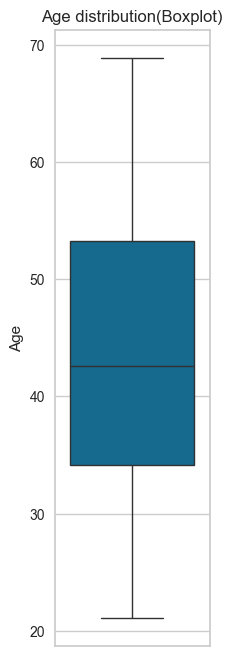

In [31]:
create_box_plot(cc_train_copy,'Age')

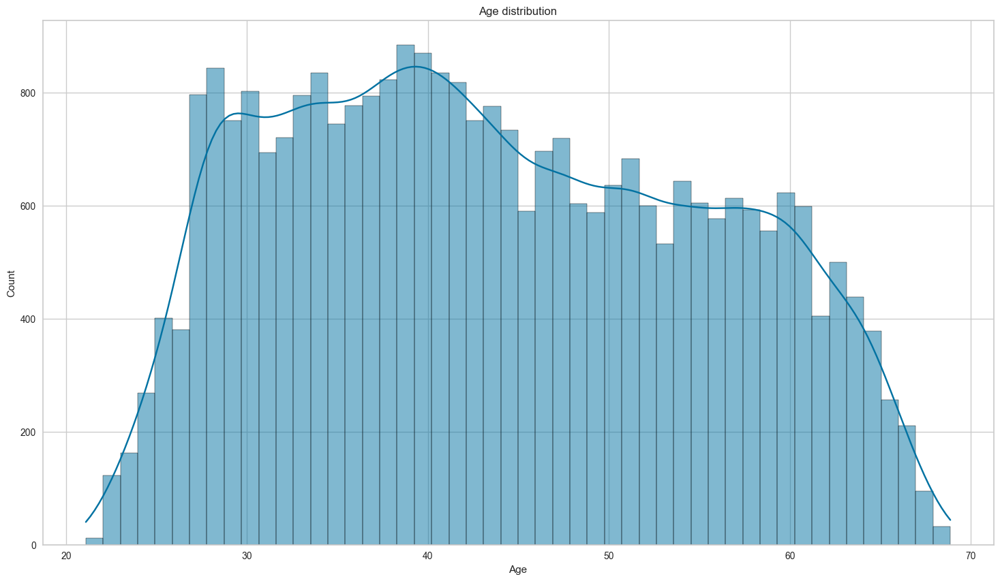

In [32]:
create_hist_plot(cc_train_copy,'Age')

* bivariate analysis with target variable

Is high risk
0    43.753103
1    43.538148
Name: Age, dtype: float64


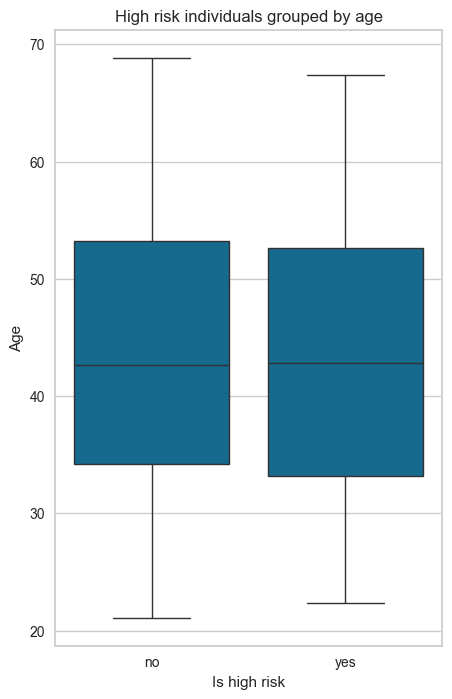

In [33]:
low_high_risk_box_plot(cc_train_copy,'Age')

Interpretation:
- Nasabah termuda berusia 21 tahun, sedangkan yang tertua berusia 68 tahun, dengan rata-rata usia 43,7 tahun dan median 42,6 tahun (median tahan terhadap outlier).
- Fitur usia tidak terdistribusi normal, cenderung sedikit miring ke kanan (positively skewed).
- Tidak terdapat perbedaan yang signifikan antara rata-rata usia nasabah berisiko tinggi dan rendah.

### C.3.3 Marital status

In [34]:
gen_info_feat(cc_train_copy,'Marital status')

Description:
count       29165
unique          5
top       Married
freq        20044
Name: Marital status, dtype: object
**************************************************
Object type:
object
**************************************************
Value count:
                      Count  Frequency (%)
Marital status                            
Married               20044      68.726213
Single / not married   3864      13.248757
Civil marriage         2312       7.927310
Separated              1712       5.870050
Widow                  1233       4.227670


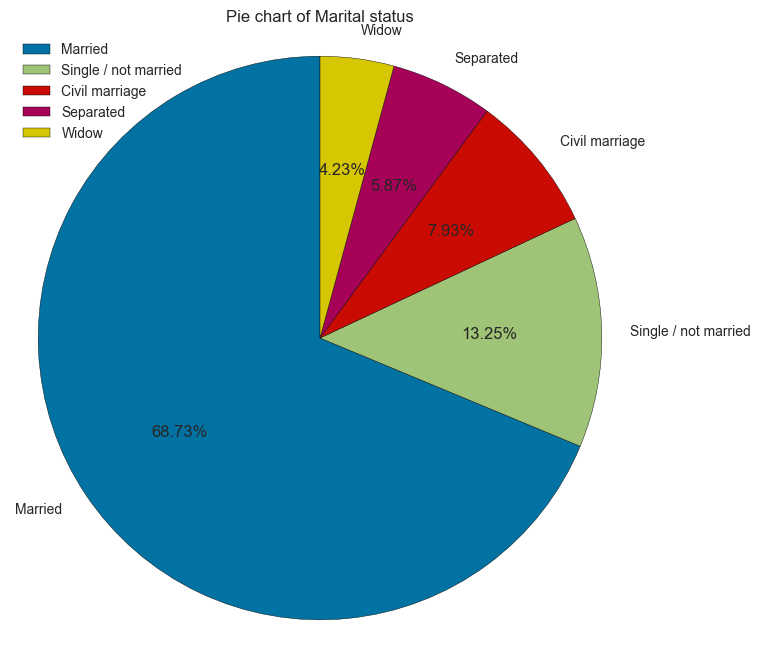

In [35]:
create_pie_plot(cc_train_copy,'Marital status')

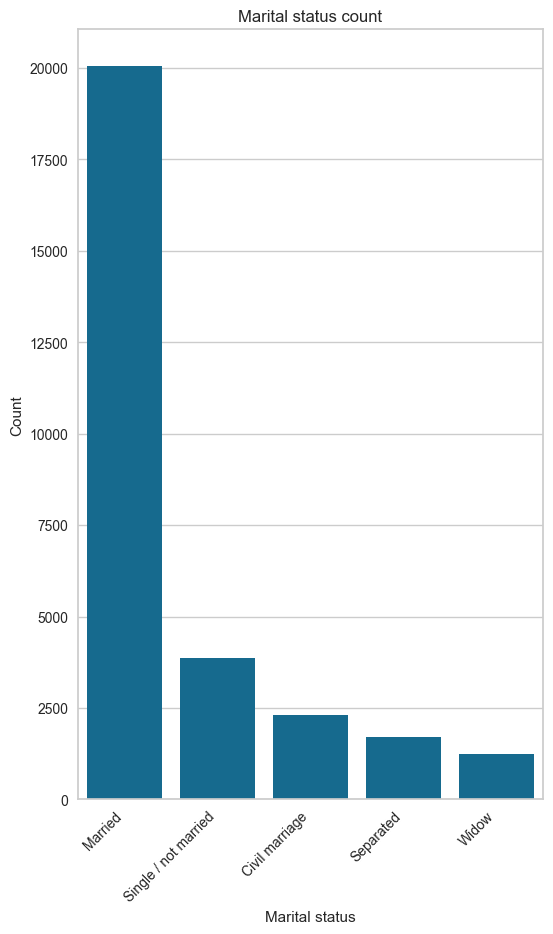

In [36]:
create_bar_plot(cc_train_copy,'Marital status')

{'Married': 320, 'Single / not married': 87, 'Civil marriage': 34, 'Widow': 34, 'Separated': 24}


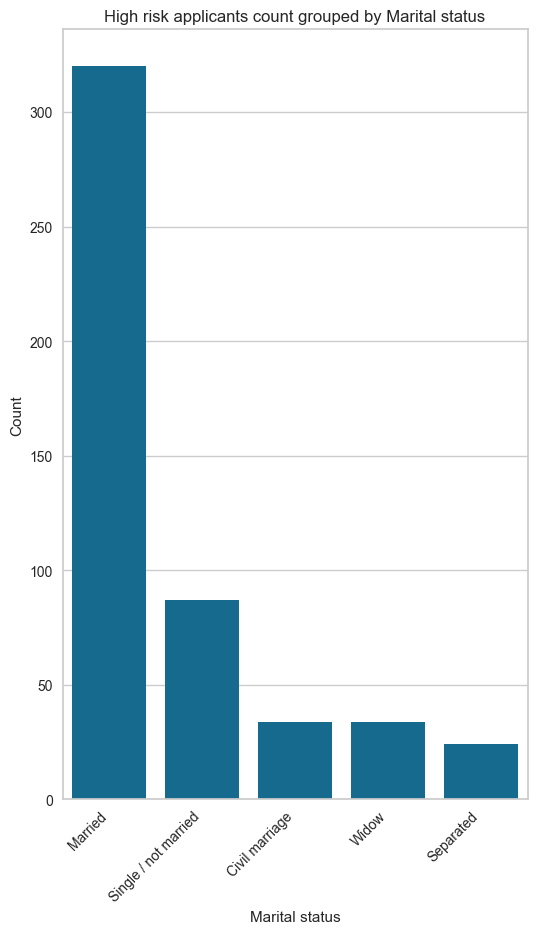

In [37]:
low_high_risk_bar_plot(cc_train_copy,'Marital status')

Interpretation:
- Sebagian besar nasabah telah menikah.
- Meskipun jumlah nasabah yang bercerai lebih banyak dibandingkan yang janda/duda, nasabah yang janda/duda tampaknya memiliki risiko lebih tinggi dibandingkan yang bercerai.

### C.3.4 Family member count

In [38]:
gen_info_feat(cc_train_copy,'Family member count')

Description:
count    29165.000000
mean         2.197531
std          0.912189
min          1.000000
25%          2.000000
50%          2.000000
75%          3.000000
max         20.000000
Name: Family member count, dtype: float64
**************************************************
Object type:
float64
**************************************************
Value count:
                     Count  Frequency (%)
Family member count                      
2.0                  15552      53.324190
1.0                   5613      19.245671
3.0                   5121      17.558718
4.0                   2503       8.582205
5.0                    309       1.059489
6.0                     48       0.164581
7.0                     14       0.048003
9.0                      2       0.006858
15.0                     2       0.006858
20.0                     1       0.003429


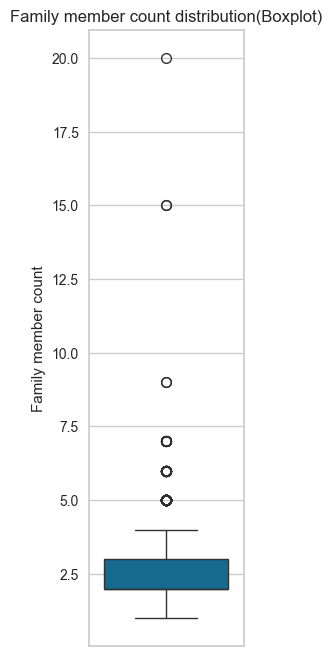

In [39]:
create_box_plot(cc_train_copy,'Family member count')

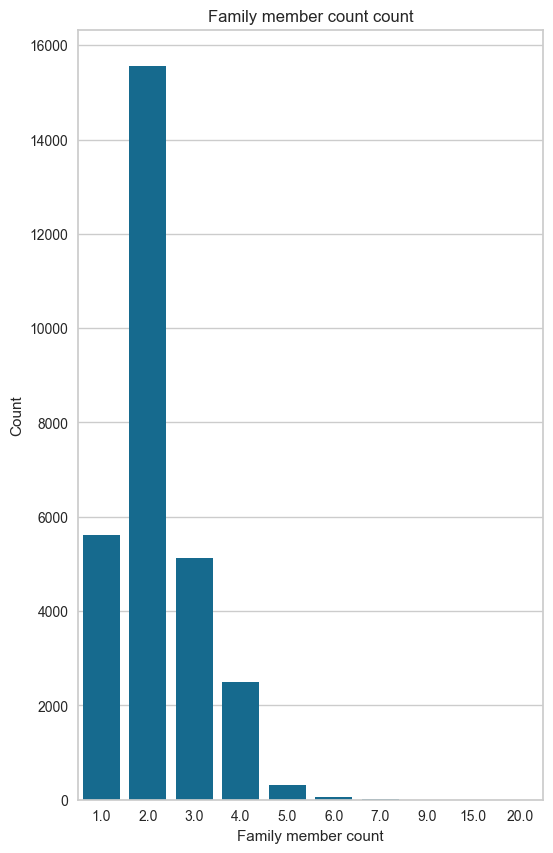

In [40]:
create_bar_plot(cc_train_copy,'Family member count')

Interpretation:
- Sebagian besar nasabah memiliki dua anggota dalam rumah tangga, yang juga sejalan dengan fakta bahwa kebanyakan tidak memiliki anak (akan dibahas lebih lanjut).
- Terdapat 6 outlier, di mana 2 di antaranya tergolong ekstrem dengan 20 dan 15 anggota dalam rumah tangga.

### C.3.5 Children count

In [41]:
gen_info_feat(cc_train_copy,'Children count')

Description:
count    29165.000000
mean         0.430790
std          0.741882
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         19.000000
Name: Children count, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
                Count  Frequency (%)
Children count                      
0               20143      69.065661
1                6003      20.582890
2                2624       8.997086
3                 323       1.107492
4                  52       0.178296
5                  15       0.051432
7                   2       0.006858
14                  2       0.006858
19                  1       0.003429


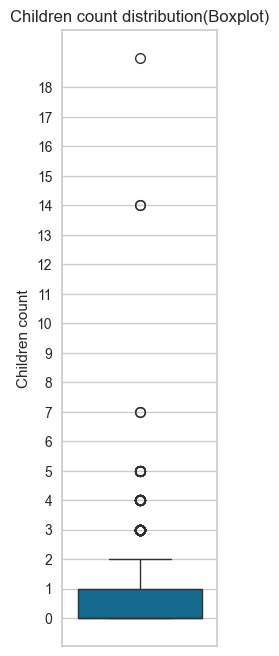

In [42]:
create_box_plot(cc_train_copy,'Children count')

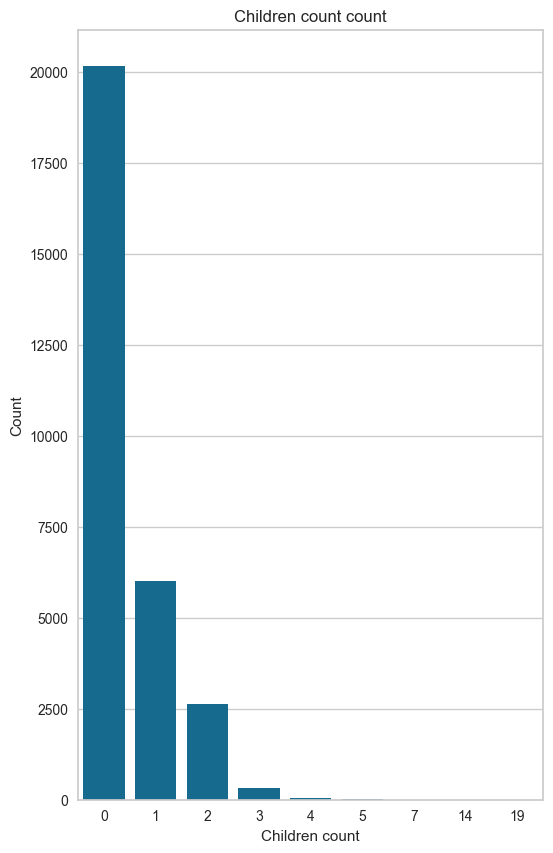

In [43]:
create_bar_plot(cc_train_copy,'Children count')

Interpretation:
- Seperti yang telah dibahas sebelumnya, sebagian besar nasabah tidak memiliki anak.
- Terdapat 6 outlier di data ini, kemungkinan sama dengan outlier pada jumlah anggota rumah tangga.

### C.3.6 Dwelling type

In [44]:
gen_info_feat(cc_train_copy,'Dwelling')

Description:
count                 29165
unique                    6
top       House / apartment
freq                  26059
Name: Dwelling, dtype: object
**************************************************
Object type:
object
**************************************************
Value count:
                     Count  Frequency (%)
Dwelling                                 
House / apartment    26059      89.350249
With parents          1406       4.820847
Municipal apartment    912       3.127036
Rented apartment       453       1.553232
Office apartment       208       0.713184
Co-op apartment        127       0.435453


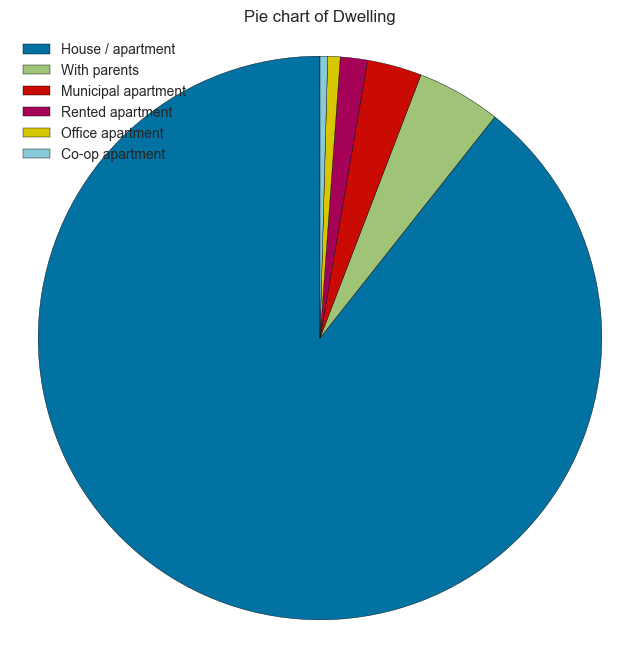

In [45]:
create_pie_plot(cc_train_copy,'Dwelling')

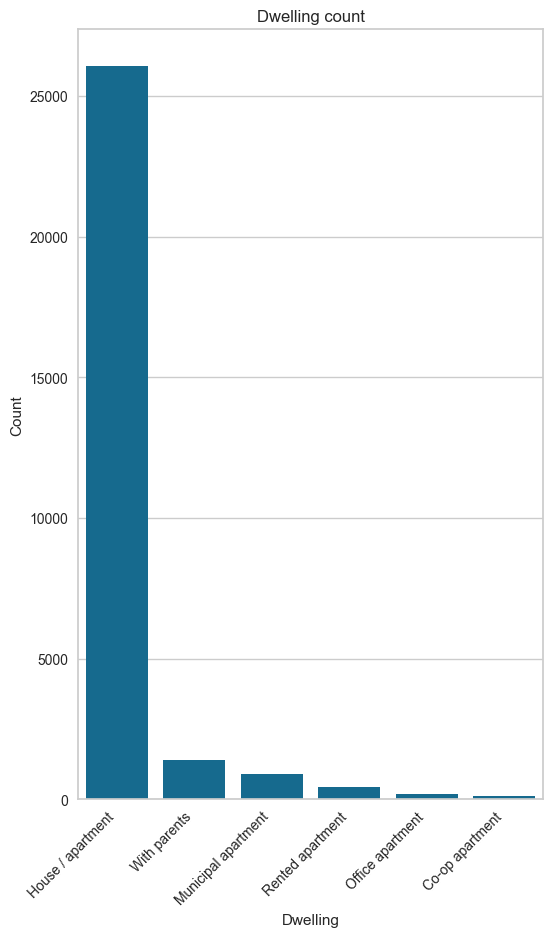

In [46]:
create_bar_plot(cc_train_copy,'Dwelling')

Interpretation:
- Hampir semua nasabah tinggal di rumah atau apartemen.

### C.3.7 Income

In [47]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
gen_info_feat(cc_train_copy,'Income')

Description:
count     29165.00
mean     186890.39
std      101409.64
min       27000.00
25%      121500.00
50%      157500.00
75%      225000.00
max     1575000.00
Name: Income, dtype: float64
**************************************************
Object type:
float64
**************************************************
Value count:
           Count  Frequency (%)
Income                         
135000.00   3468          11.89
180000.00   2487           8.53
157500.00   2469           8.47
225000.00   2373           8.14
112500.00   2359           8.09
...          ...            ...
151200.00      1           0.00
33750.00       1           0.00
61875.00       1           0.00
234135.00      1           0.00
82350.00       1           0.00

[259 rows x 2 columns]


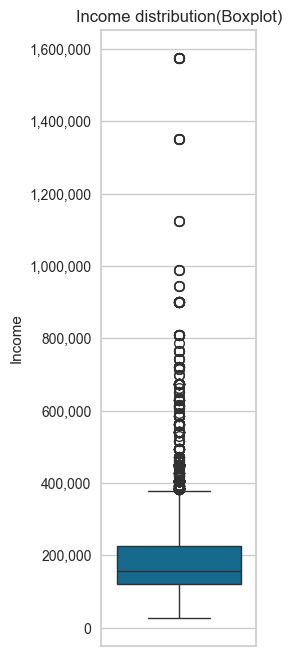

In [48]:
create_box_plot(cc_train_copy,'Income')

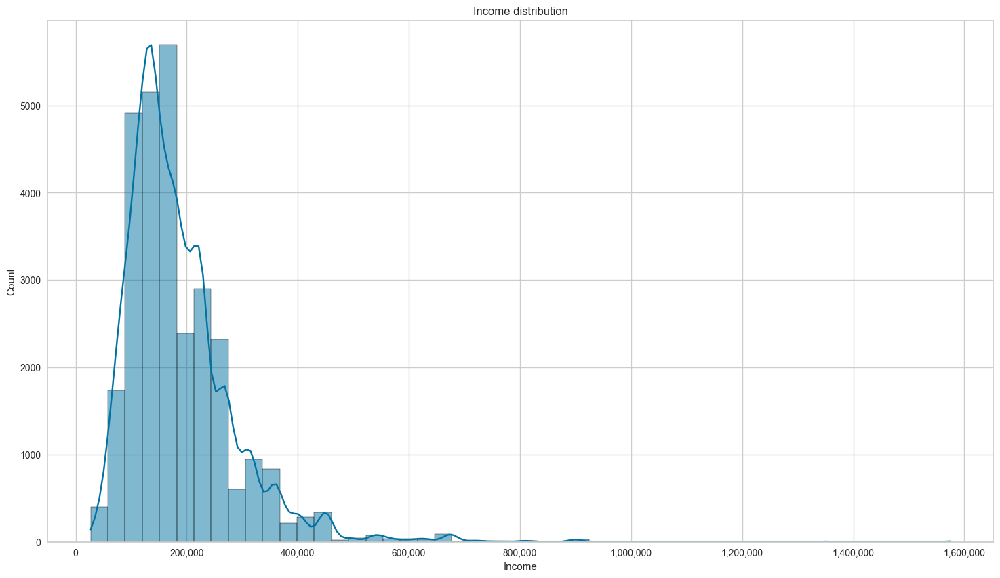

In [49]:
create_hist_plot(cc_train_copy,'Income')

* bivariate analysis with target variable

Is high risk
0   186913.94
1   185537.26
Name: Income, dtype: float64


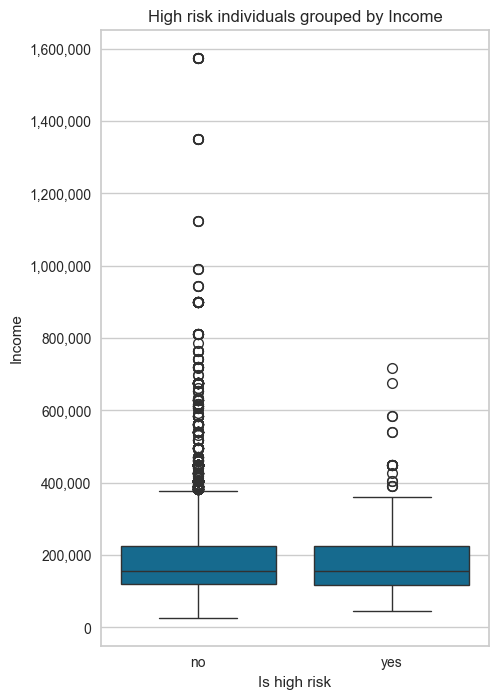

In [50]:
low_high_risk_box_plot(cc_train_copy,'Income')

Interpretation:
- Rata-rata pendapatan nasabah adalah 186.890, namun angka ini dipengaruhi oleh outlier. Jika outlier diabaikan, sebagian besar nasabah memiliki pendapatan sekitar 157.500.
- Terdapat 3 nasabah dengan pendapatan lebih dari 1.000.000.
- Fitur pendapatan cenderung miring ke kanan (positively skewed).
- Nasabah berisiko tinggi dan rendah memiliki pendapatan yang kurang lebih sama.

### C.3.8 Job title

In [51]:
gen_info_feat(cc_train_copy,'Job title')

Description:
count        20138
unique          18
top       Laborers
freq          5004
Name: Job title, dtype: object
**************************************************
Object type:
object
**************************************************
Value count:
                       Count  Frequency (%)
Job title                                  
Laborers                5004          24.85
Core staff              2866          14.23
Sales staff             2773          13.77
Managers                2422          12.03
Drivers                 1722           8.55
High skill tech staff   1133           5.63
Accountants              998           4.96
Medicine staff           956           4.75
Cooking staff            521           2.59
Security staff           464           2.30
Cleaning staff           425           2.11
Private service staff    287           1.43
Low-skill Laborers       138           0.69
Waiters/barmen staff     127           0.63
Secretaries              122           0.

In [52]:
job_title_nan_count = cc_train_copy['Job title'].isna().sum()
job_title_nan_count

np.int64(9027)

In [53]:
rows_total_count = cc_train_copy.shape[0]

In [54]:
print('The percentage of missing rows is {:.2f} %'.format(job_title_nan_count * 100 / rows_total_count))

The percentage of missing rows is 30.95 %


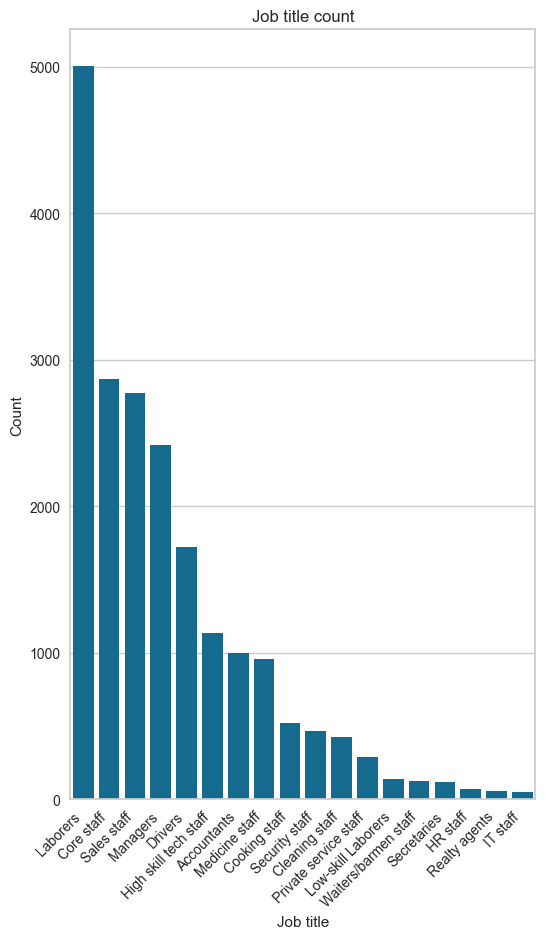

In [55]:
create_bar_plot(cc_train_copy,'Job title')

Interpretation:

-	Pekerjaan dengan jumlah terbanyak adalah Laborers, jauh lebih dominan dibandingkan kategori pekerjaan lainnya

-	Sebesar 30,95% data memiliki nilai yang hilang (missing values)

### C.3.9 Employment status

In [56]:
gen_info_feat(cc_train_copy,'Employment status')

Description:
count       29165
unique          5
top       Working
freq        15056
Name: Employment status, dtype: object
**************************************************
Object type:
object
**************************************************
Value count:
                      Count  Frequency (%)
Employment status                         
Working               15056          51.62
Commercial associate   6801          23.32
Pensioner              4920          16.87
State servant          2381           8.16
Student                   7           0.02


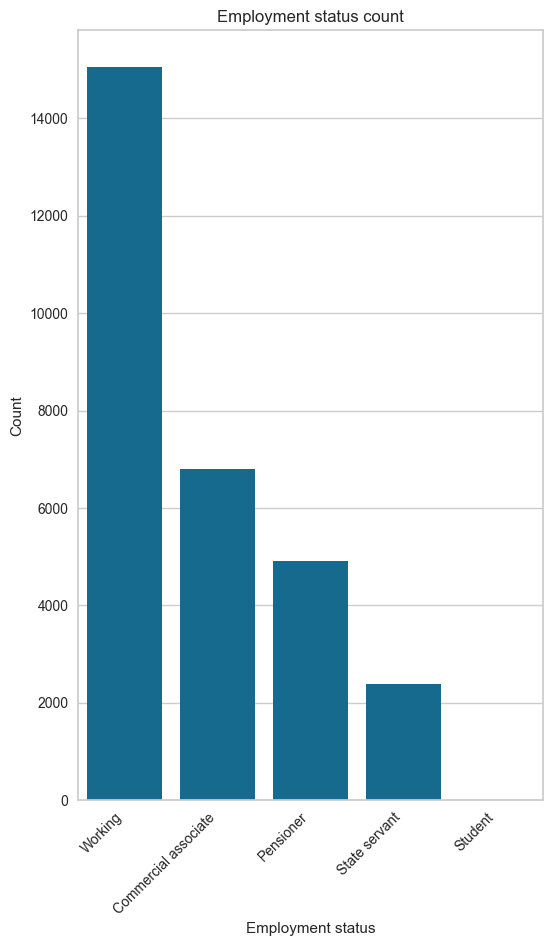

In [57]:
create_bar_plot(cc_train_copy,'Employment status')

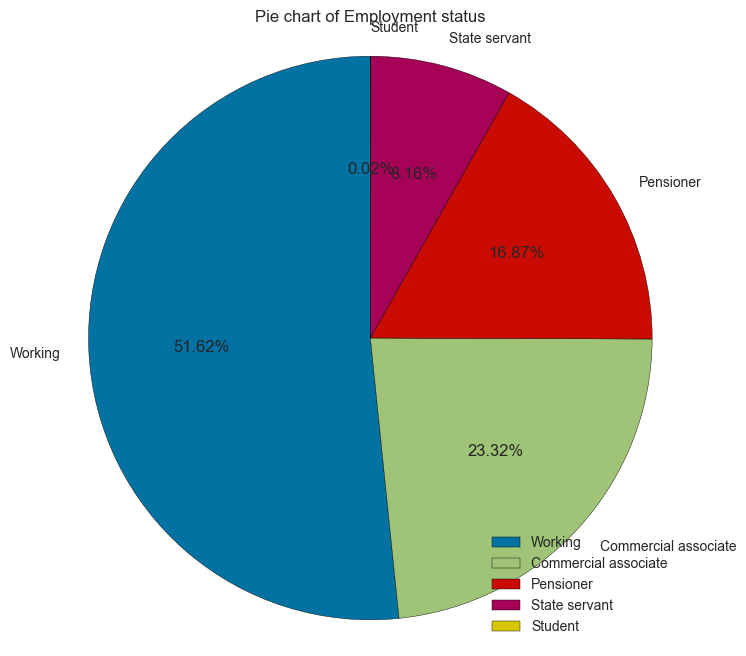

In [58]:
create_pie_plot(cc_train_copy,'Employment status')

Interpretation:
- Sebagian besar nasabah sedang bekerja atau memiliki pekerjaan.

### C.3.10 Education level

In [59]:
gen_info_feat(cc_train_copy,'Education level')

Description:
count                             29165
unique                                5
top       Secondary / secondary special
freq                              19803
Name: Education level, dtype: object
**************************************************
Object type:
object
**************************************************
Value count:
                               Count  Frequency (%)
Education level                                    
Secondary / secondary special  19803          67.90
Higher education                7910          27.12
Incomplete higher               1129           3.87
Lower secondary                  298           1.02
Academic degree                   25           0.09


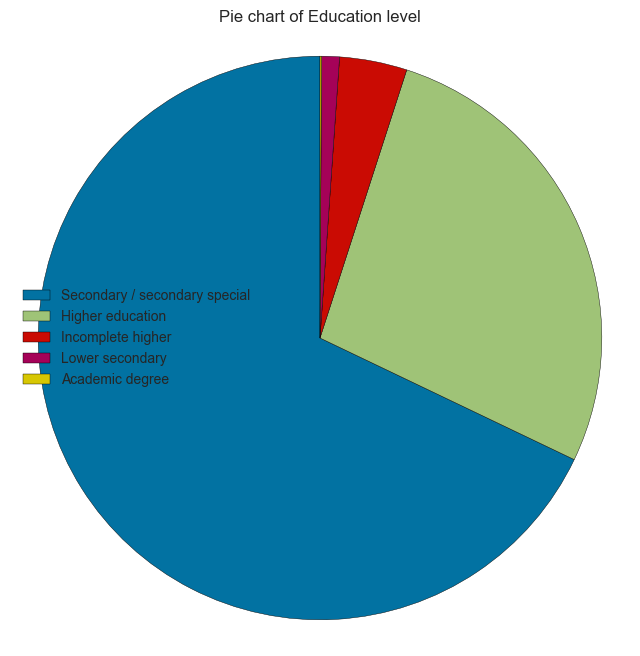

In [60]:
create_pie_plot(cc_train_copy,'Education level')

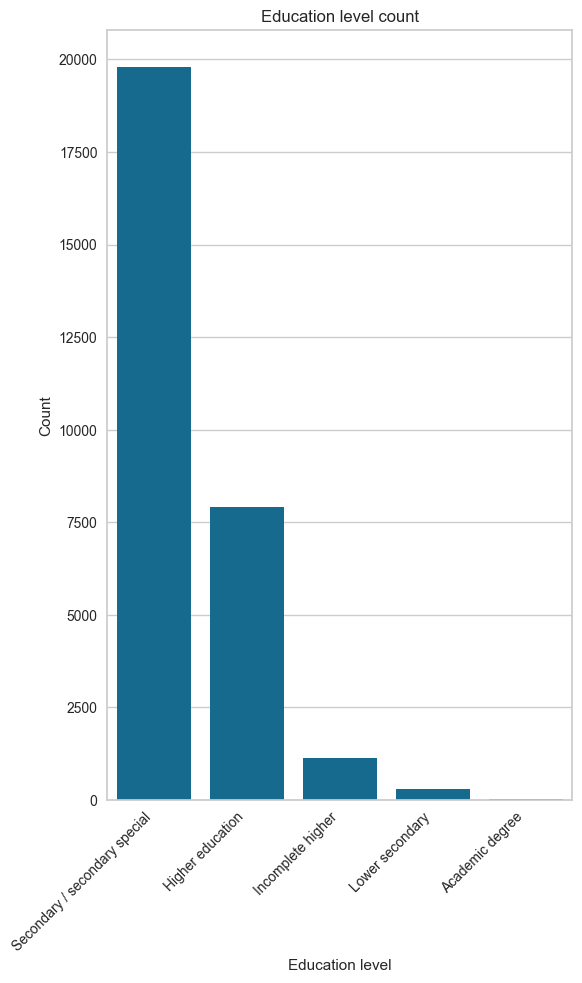

In [61]:
create_bar_plot(cc_train_copy,'Education level')

Interpretation:
-	Sebagian besar nasabah telah menyelesaikan pendidikan menengah, sedangkan sekitar ¼ dari mereka menyelesaikan pendidikan tinggi.

### C.3.11 Employment length

In [62]:
gen_info_feat(cc_train_copy,'Employment length')

Description:
count   24257.00
mean        7.26
std         6.46
min         0.05
25%         2.68
50%         5.45
75%         9.60
max        43.02
Name: Employment length, dtype: float64
**************************************************
Object type:int64


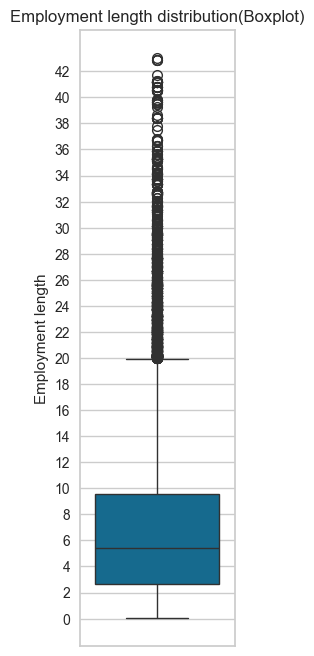

In [63]:
create_box_plot(cc_train_copy,'Employment length')

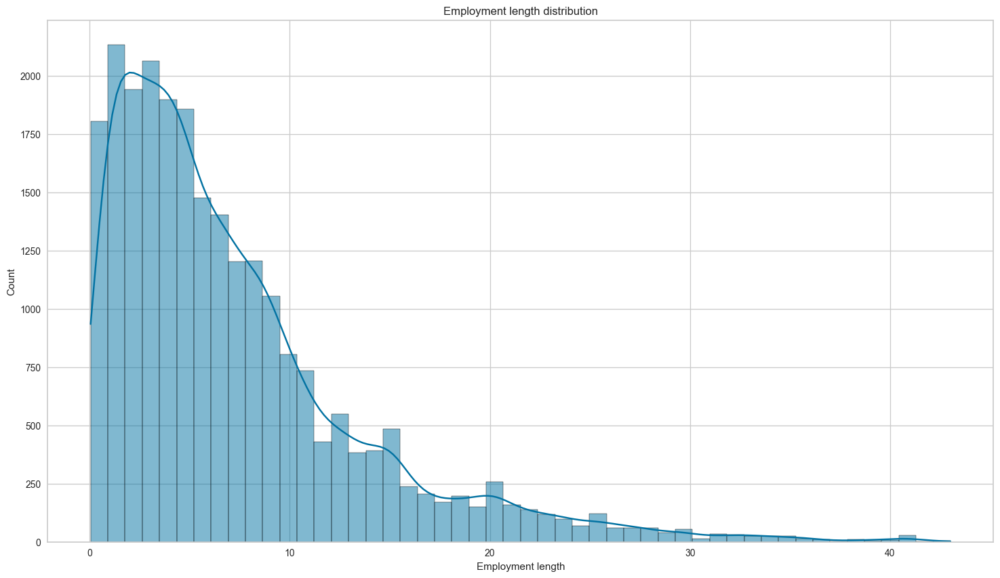

In [64]:
create_hist_plot(cc_train_copy,'Employment length')

* bivariate analysis with target variable

Is high risk
0   7.29
1   5.75
Name: Employment length, dtype: float64


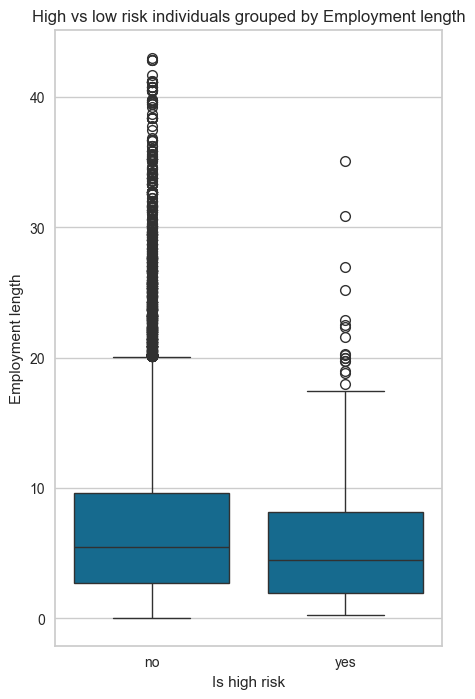

In [65]:
# distribution of employment length for high vs low risk applicants
# Here 0 means No and 1 means Yes
low_high_risk_box_plot(cc_train_copy,'Employment length')

Interpretation:
- Sebagian besar nasabah rata-rata telah bekerja selama 5 hingga 7 tahun.
- Terdapat sejumlah outlier yang telah bekerja lebih dari 20 tahun.
- Lama bekerja cenderung miring ke kanan (positively skewed).
- Nasabah berisiko tinggi memiliki lama bekerja lebih rendah, yaitu sekitar 5 tahun, dibandingkan 7 tahun pada nasabah berisiko rendah.

### C.3.12 Has a car

In [66]:
gen_info_feat(cc_train_copy,'Has a car')

Description:
count     29165
unique        2
top           N
freq      18128
Name: Has a car, dtype: object
**************************************************
Object type:
object
**************************************************
Value count:
           Count  Frequency (%)
Has a car                      
N          18128          62.16
Y          11037          37.84


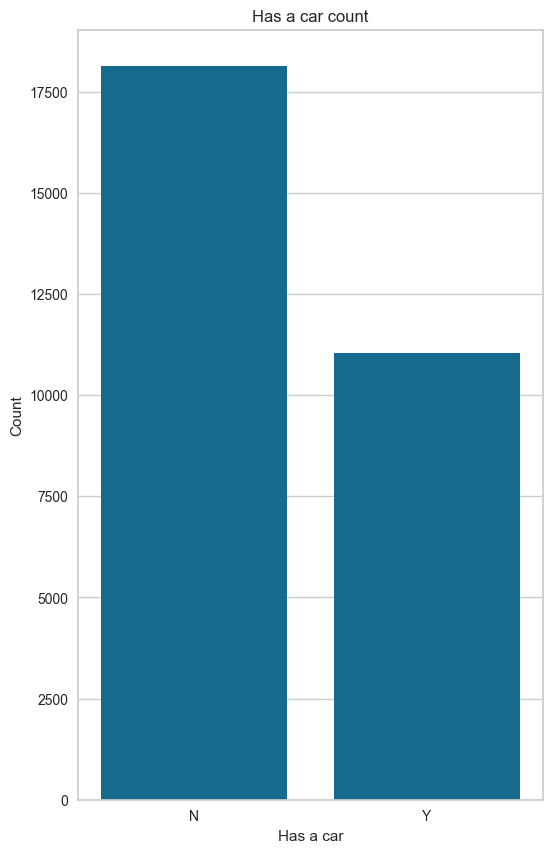

In [67]:
create_bar_plot(cc_train_copy,'Has a car')

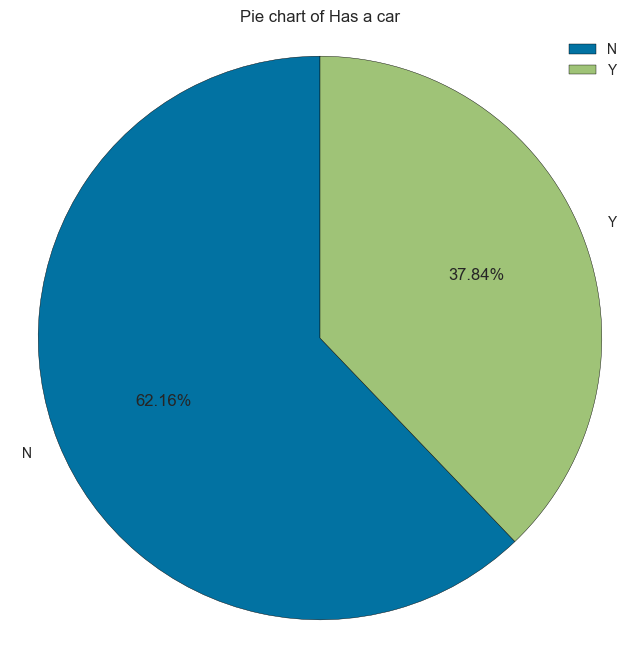

In [68]:
create_pie_plot(cc_train_copy,'Has a car')

Interpretation:
- Sebagian besar nasabah tidak memiliki mobil.

### C.3.13 Has a property

In [69]:
gen_info_feat(cc_train_copy,'Has a property')

Description:
count     29165
unique        2
top           Y
freq      19557
Name: Has a property, dtype: object
**************************************************
Object type:
object
**************************************************
Value count:
                Count  Frequency (%)
Has a property                      
Y               19557          67.06
N                9608          32.94


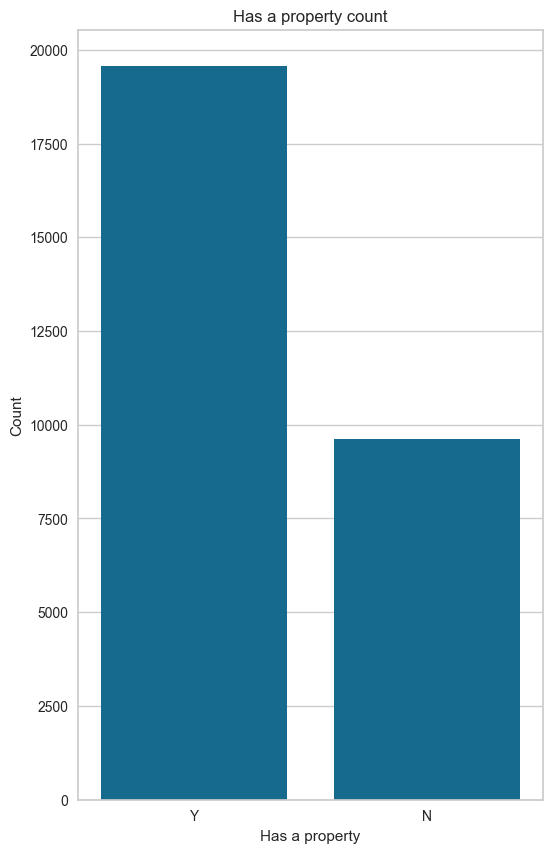

In [70]:
create_bar_plot(cc_train_copy,'Has a property')

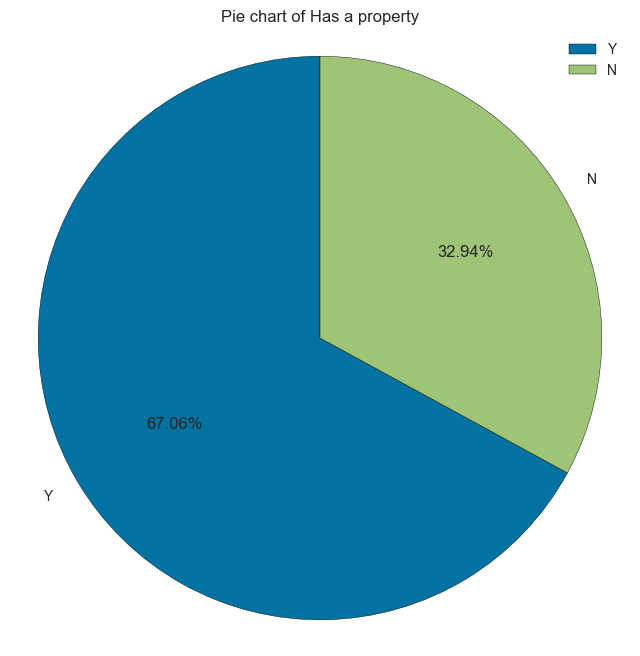

In [71]:
create_pie_plot(cc_train_copy,'Has a property')

Interpretation:
- Sebagian besar nasabah memiliki properti.

### C.3.14 Has a work phone

In [72]:
gen_info_feat(cc_train_copy,'Has a work phone')

Description:
count   29165.00
mean        0.22
std         0.42
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         1.00
Name: Has a work phone, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
                  Count  Frequency (%)
Has a work phone                      
0                 22623          77.57
1                  6542          22.43


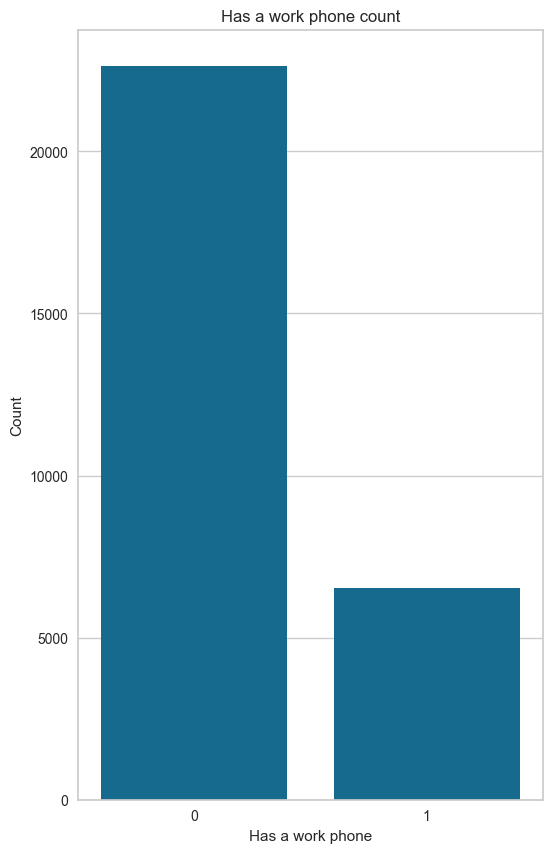

In [73]:
create_bar_plot(cc_train_copy,'Has a work phone')

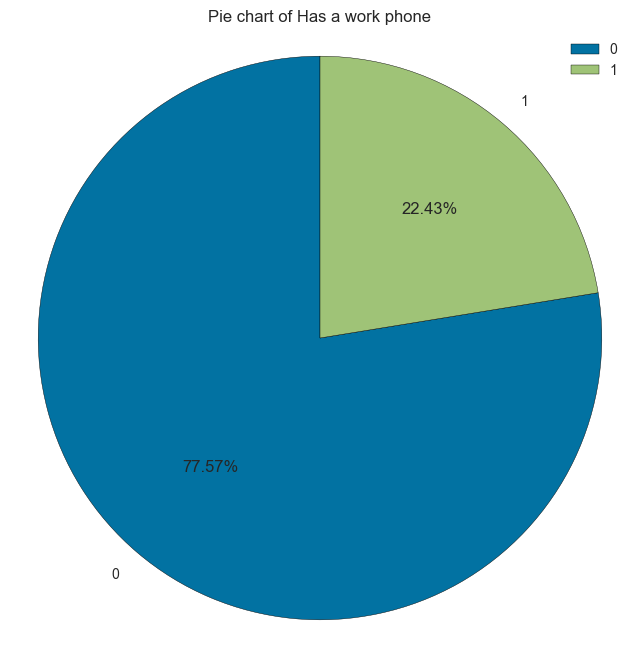

In [74]:
create_pie_plot(cc_train_copy,'Has a work phone')

Interpretation:
- Lebih dari ¾ nasabah tidak memiliki telepon kerja.

Catatan: 0 berarti tidak, 1 berarti ya.

### C.3.15 Has a mobile phone

In [75]:
gen_info_feat(cc_train_copy,'Has a mobile phone')

Description:
count   29165.00
mean        1.00
std         0.00
min         1.00
25%         1.00
50%         1.00
75%         1.00
max         1.00
Name: Has a mobile phone, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
                    Count  Frequency (%)
Has a mobile phone                      
1                   29165         100.00


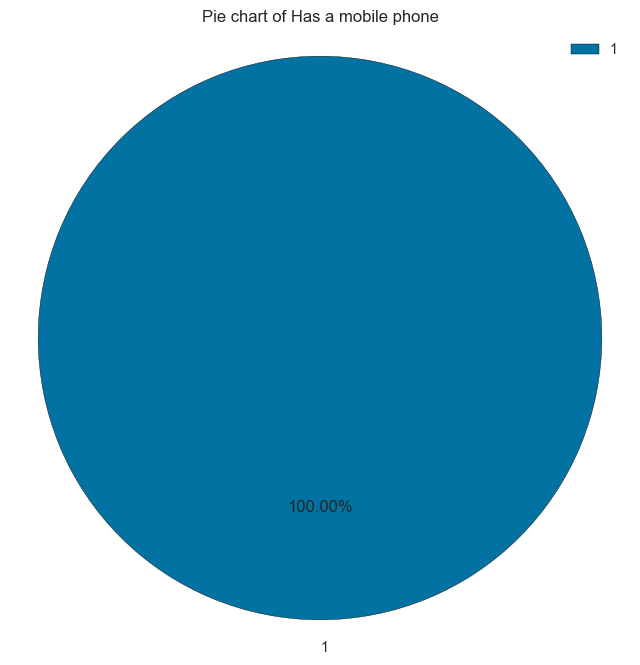

In [76]:
create_pie_plot(cc_train_copy,'Has a mobile phone')

Interpretation:
- Semua nasabah, tanpa kecuali, memiliki telepon seluler.

Catatan: 0 berarti tidak, 1 berarti ya.

### C.3.16 Has a phone

In [77]:
gen_info_feat(cc_train_copy,'Has a phone')

Description:
count   29165.00
mean        0.29
std         0.46
min         0.00
25%         0.00
50%         0.00
75%         1.00
max         1.00
Name: Has a phone, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
             Count  Frequency (%)
Has a phone                      
0            20562          70.50
1             8603          29.50


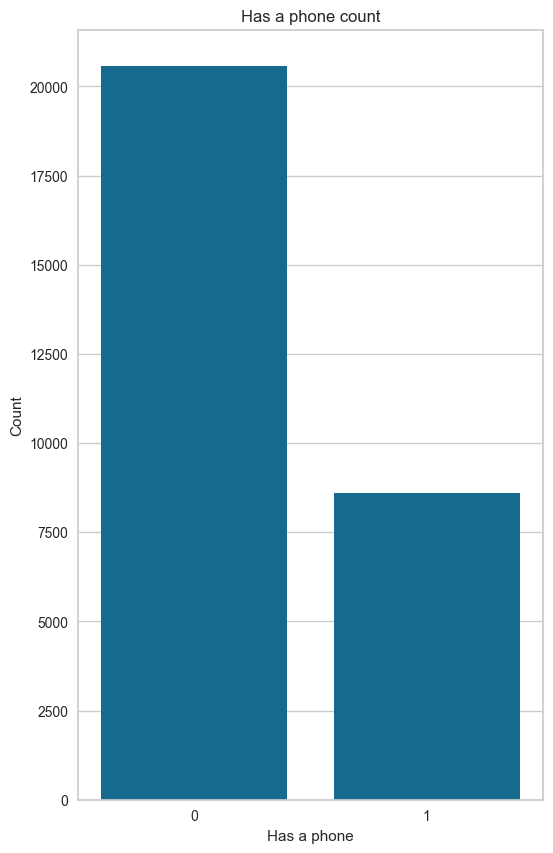

In [78]:
create_bar_plot(cc_train_copy,'Has a phone')

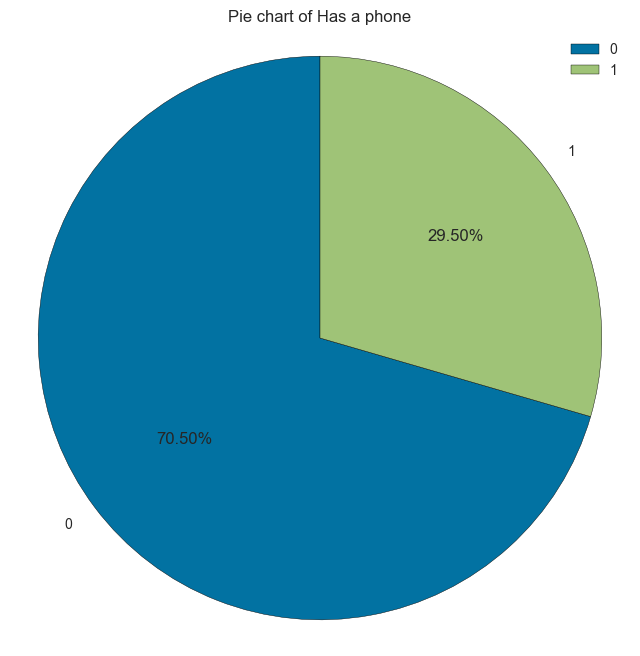

In [79]:
create_pie_plot(cc_train_copy,'Has a phone')

Interpretation:
- Sebagian besar nasabah tidak memiliki telepon rumah.

Catatan: 0 berarti tidak, 1 berarti ya.

### C.3.17 Has an email

In [80]:
gen_info_feat(cc_train_copy,'Has an email')

Description:
count   29165.00
mean        0.09
std         0.29
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         1.00
Name: Has an email, dtype: float64
**************************************************
Object type:
int64
**************************************************
Value count:
              Count  Frequency (%)
Has an email                      
0             26532          90.97
1              2633           9.03


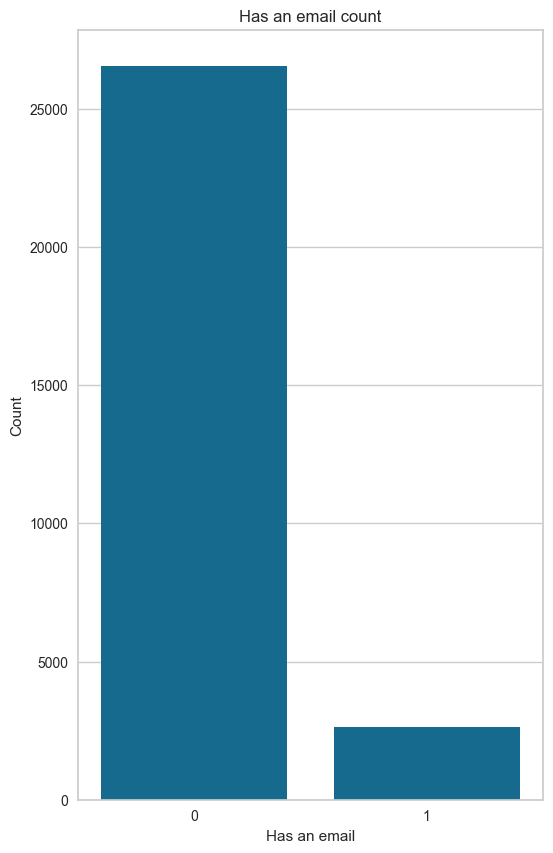

In [81]:
create_bar_plot(cc_train_copy,'Has an email')

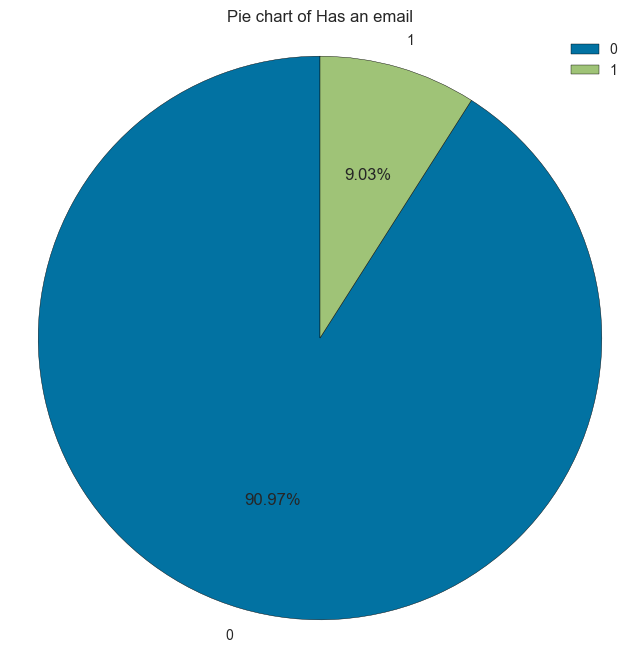

In [82]:
create_pie_plot(cc_train_copy,'Has an email')

Interpretation:
- Lebih dari 90% nasabah tidak memiliki alamat email.

Catatan: 0 berarti tidak, 1 berarti ya.

### C.3.18 Account age

In [83]:
gen_info_feat(cc_train_copy,'Account age')

Description:
count   29165.00
mean       26.14
std        16.49
min         0.00
25%        12.00
50%        24.00
75%        39.00
max        60.00
Name: Account age, dtype: float64
**************************************************
Object type:float64


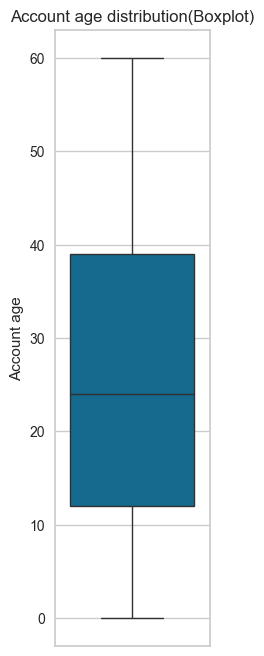

In [84]:
create_box_plot(cc_train_copy,'Account age')

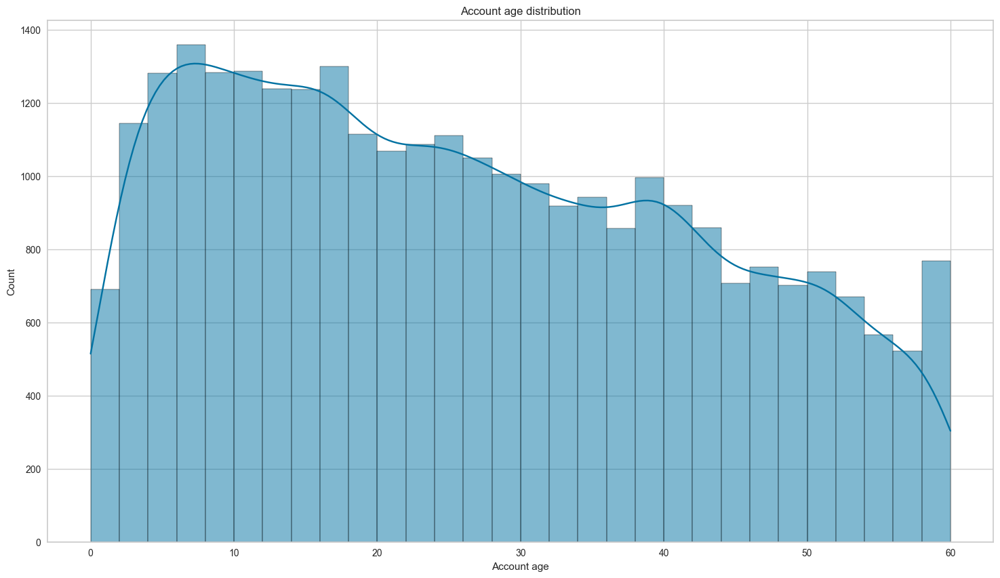

In [85]:
create_hist_plot(cc_train_copy,'Account age', the_bins=30)

* bivariate analysis with target variable

Is high risk
0   26.00
1   34.04
Name: Account age, dtype: float64


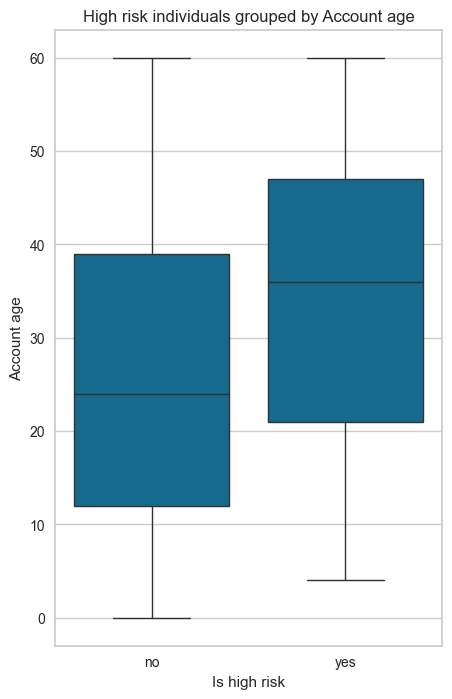

In [86]:
low_high_risk_box_plot(cc_train_copy,'Account age')

Interpretation:
- Sebagian besar akun berusia sekitar 26 bulan.
- Usia akun tidak terdistribusi normal, cenderung miring ke kanan (positively skewed).
- Akun yang ditandai berisiko tinggi rata-rata berusia 34 bulan, dibandingkan 26 bulan untuk akun berisiko rendah.

### C.3.19 Is high risk (target variable)

In [87]:
gen_info_feat(cc_train_copy,'Is high risk')

Description:
count     29165
unique        2
top           0
freq      28666
Name: Is high risk, dtype: int64
**************************************************
Object type:
object
**************************************************
Value count:
              Count  Frequency (%)
Is high risk                      
0             28666          98.29
1               499           1.71


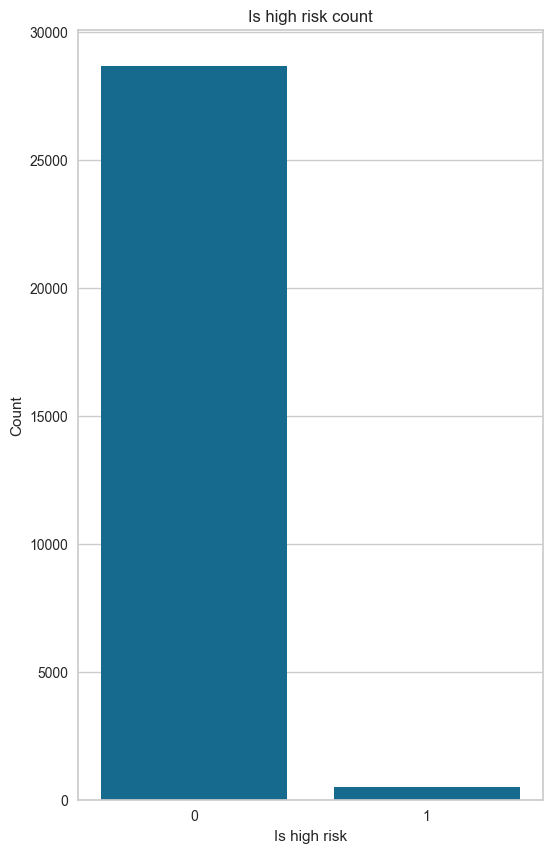

In [88]:
create_bar_plot(cc_train_copy,'Is high risk')

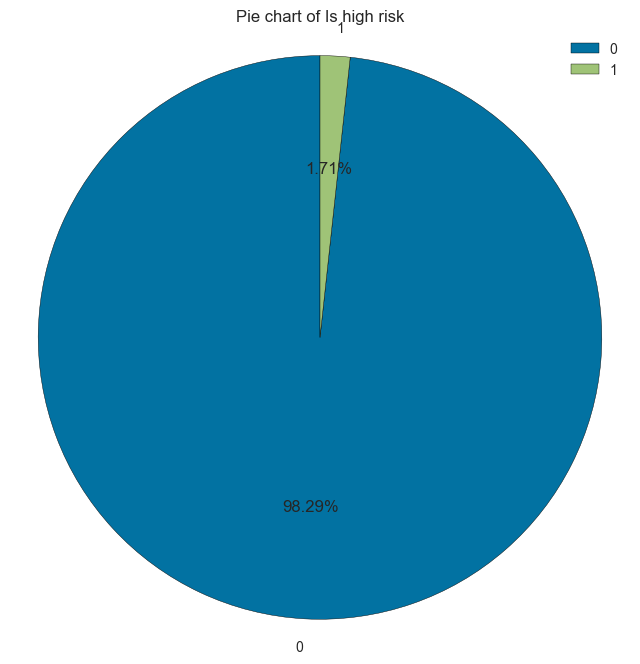

In [89]:
create_pie_plot(cc_train_copy,'Is high risk')

Interpretation:
- Sebagian besar nasabah tergolong berisiko rendah.
- Data ini sangat tidak seimbang.

Catatan: 0 berarti tidak, 1 berarti ya.

## C.4 Bivariate analysis

### C.4.1 Numerical vs numerical features (Correlation & scatter plots)

#### C.4.1.1 Scatter plots

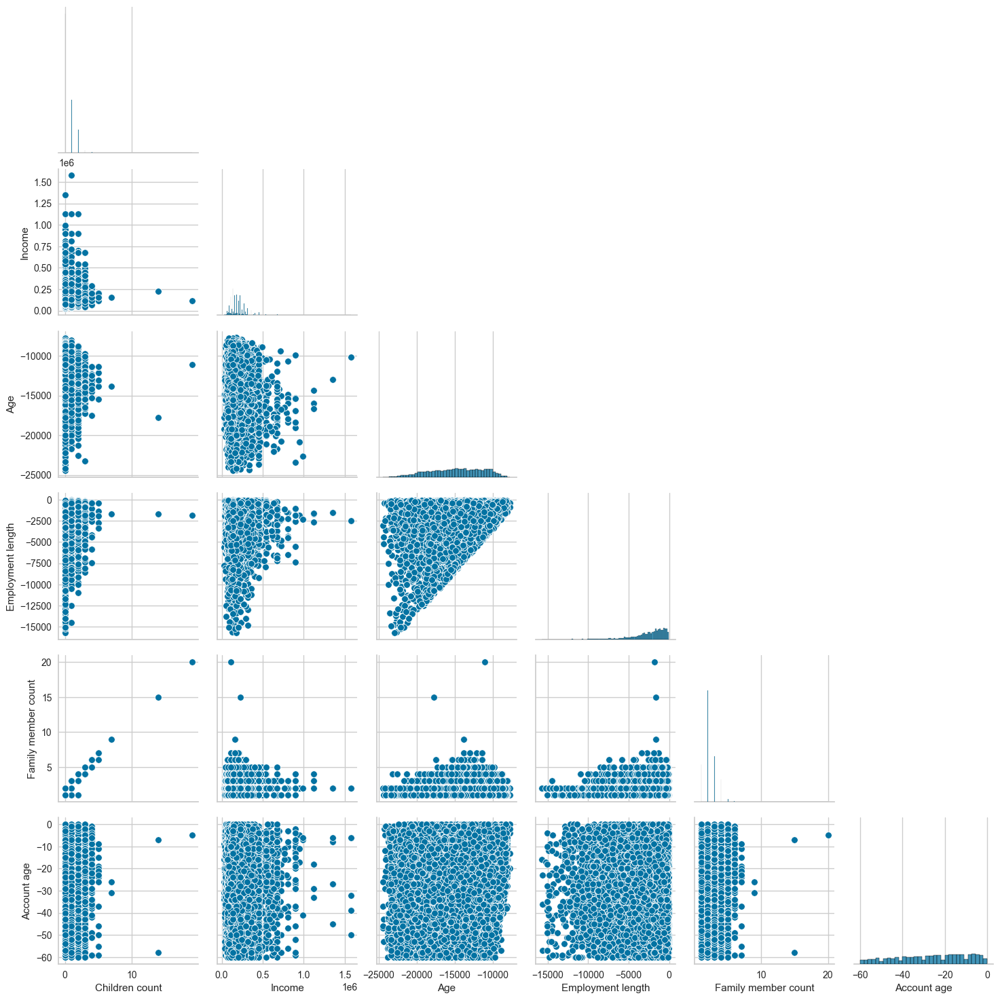

In [90]:
sns.pairplot(cc_train_copy[cc_train_copy['Employment length'] < 0].drop(['ID','Has a mobile phone', 'Has a work phone', 'Has a phone', 'Has an email','Is high risk'],axis=1),corner=True)
plt.show()

Interpretation:
- Terdapat korelasi linier positif antara jumlah anggota keluarga dan jumlah anak. Hal ini masuk akal, semakin banyak anak yang dimiliki seseorang, semakin besar jumlah anggota keluarganya. Kondisi ini menimbulkan masalah **multikolinearitas**, artinya kedua fitur ini sangat berkorelasi, sehingga salah satu perlu dihapus.
- Tren menarik lainnya terlihat pada lama bekerja dan usia. Ini juga logis, semakin lama seseorang bekerja, semakin tua usianya.

##### C.4.1.1.1 Family member count vs children count (numerical vs numerical feature comparison)

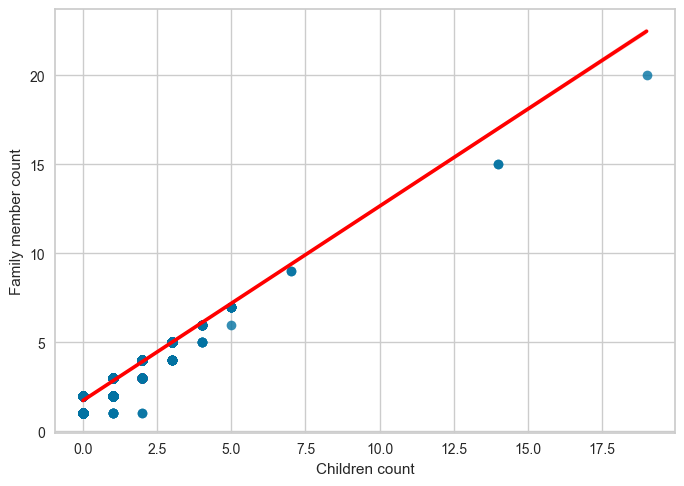

In [91]:
sns.regplot(x='Children count',y='Family member count',data=cc_train_copy,line_kws={'color': 'red'})
plt.show()

Interpretation:
- Semakin banyak anak yang dimiliki seseorang, semakin besar jumlah anggota keluarganya.

##### C.4.1.1.2 Account age vs age (numerical vs numerical feature comparison)

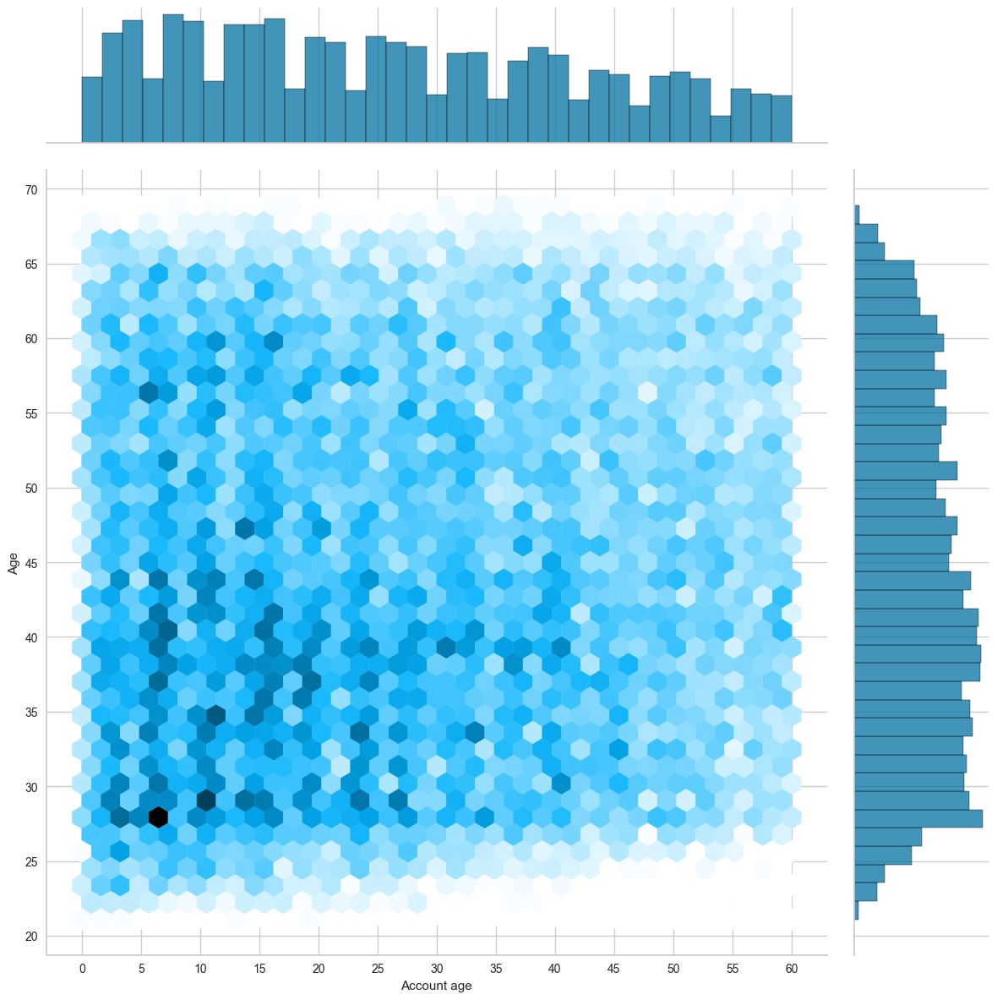

In [92]:
y_age = np.abs(cc_train_copy['Age'])/365.25
g = sns.jointplot(x=np.abs(cc_train_copy['Account age']),y=y_age,kind="hex",height=12)
g.ax_joint.set_xticks(np.arange(0, 65, 5))
g.ax_joint.set_yticks(np.arange(20, int(y_age.max())+5, 5))
g.set_axis_labels("Account age", "Age")
plt.show()

Interpretation:
- Sebagian besar nasabah berusia antara 20 hingga 45 tahun dan memiliki akun dengan usia kurang dari 25 bulan.

##### C.4.1.1.3 Employment length vs age (numerical vs numerical feature comparison)

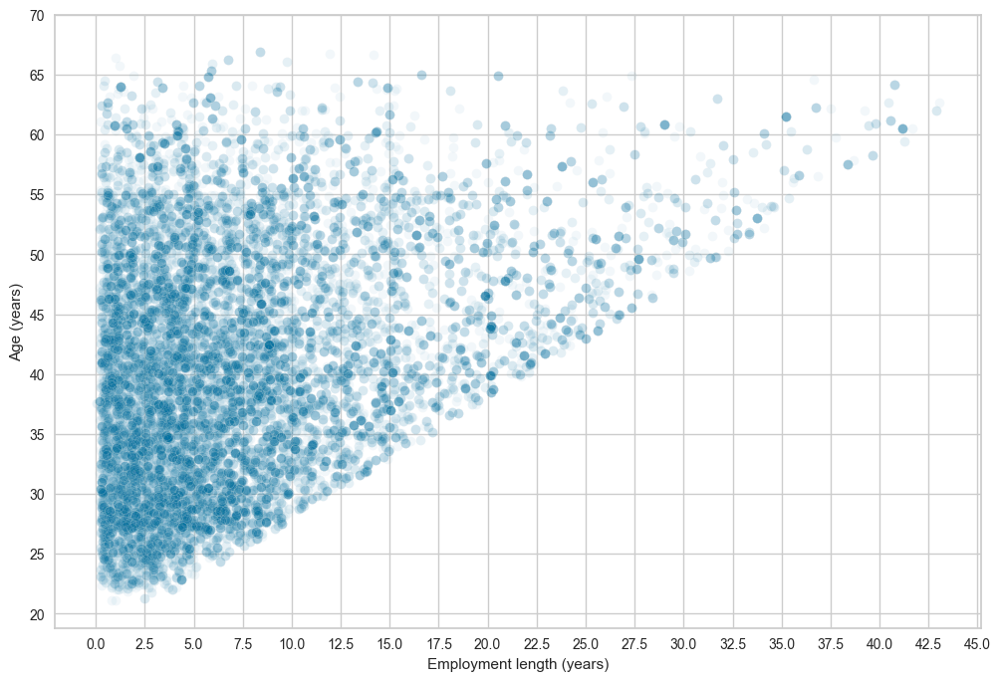

In [93]:
x_employ_length = np.abs(cc_train_copy[cc_train_copy['Employment length'] < 0]['Employment length'])/365.25
fig, ax = plt.subplots(figsize=(12, 8))
sns.scatterplot(x=x_employ_length,y=y_age,alpha=0.05,ax=ax)
ax.set_xticks(np.arange(0, x_employ_length.max()+2.5, 2.5))
ax.set_yticks(np.arange(20, int(y_age.max())+5, 5))
ax.set_xlabel("Employment length (years)")
ax.set_ylabel("Age (years)")
plt.show()

Interpretation:
- Scatterplot ini menunjukkan bahwa usia nasabah berkorelasi dengan lama bekerja.
- Bentuk plot seperti segitiga terbalik muncul karena semakin lama seseorang bekerja, semakin tua usianya. Tidak mungkin lama bekerja lebih besar daripada usia seseorang.

#### C.4.1.2 Correlation analysis

In [94]:
# change the datatype of target feature to int
is_high_risk_int = cc_train_copy['Is high risk'].astype('int32')

<Axes: >

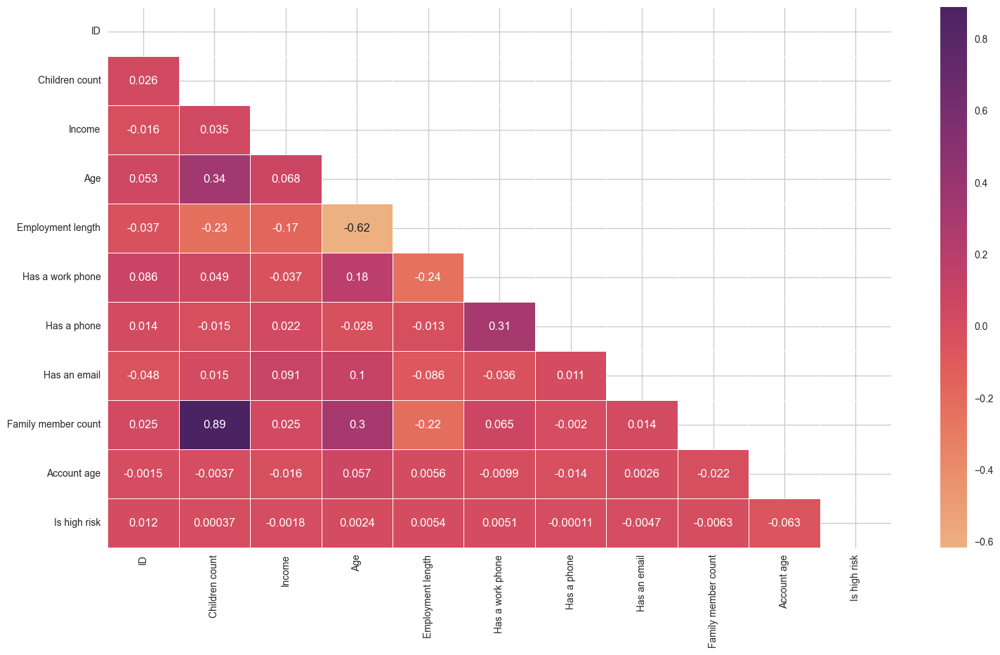

In [95]:
cc_train_copy_corr_no_mobile = pd.concat([cc_train_copy.drop(['Has a mobile phone','Is high risk'], axis=1), is_high_risk_int], axis=1)
cc_train_copy_corr_no_mobile = cc_train_copy_corr_no_mobile.select_dtypes(include=np.number).corr()
mask = np.zeros_like(cc_train_copy_corr_no_mobile, dtype=bool)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(18, 10))
sns.heatmap(cc_train_copy_corr_no_mobile, annot=True, cmap='flare', mask=mask, linewidths=0.5)

Interpretation:
- Tidak ada fitur yang berkorelasi langsung dengan fitur target.
- Jumlah anggota keluarga sangat berkorelasi dengan jumlah anak, seperti yang telah dibahas sebelumnya.
- Usia memiliki korelasi positif dengan jumlah anggota keluarga dan jumlah anak; semakin tua seseorang, semakin besar kemungkinan memiliki keluarga yang lebih besar.
- Korelasi positif lainnya terlihat antara memiliki telepon dan memiliki telepon kerja.
- Korelasi positif juga terlihat antara usia dan kepemilikan telepon kerja; semakin muda seseorang, semakin kecil kemungkinan memiliki telepon kerja.
- Terdapat juga korelasi negatif antara lama bekerja dan usia, seperti yang telah diamati sebelumnya.

### C.4.2 Numerical vs categorical features (ANOVA)

#### C.4.2.1 Age vs the rest of categorical features

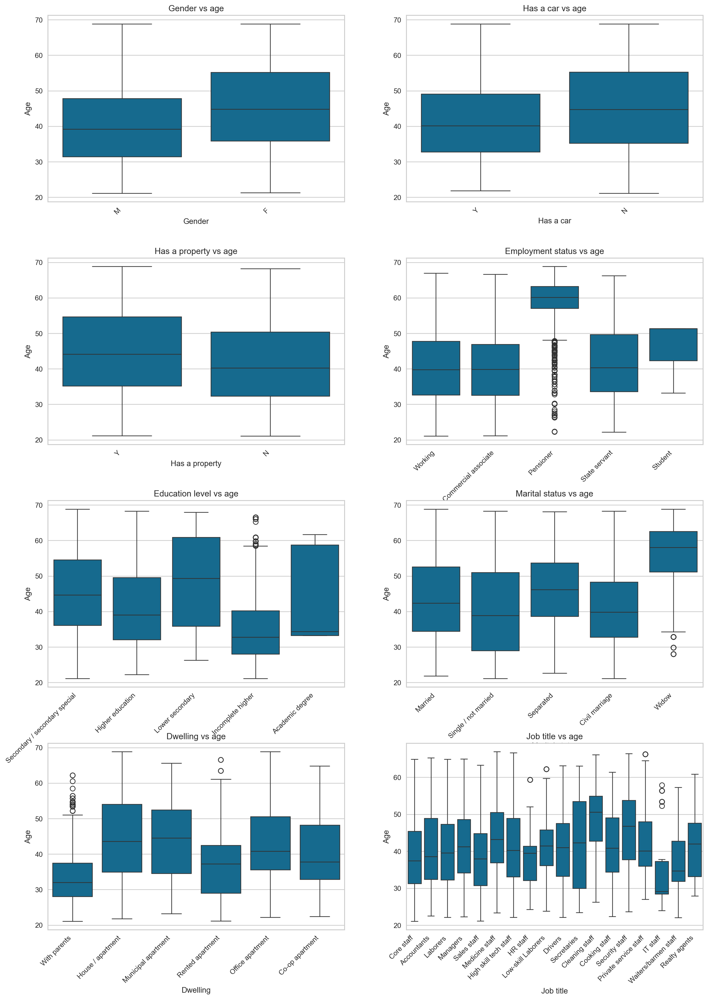

In [96]:
fig, axes = plt.subplots(4,2,figsize=(15,20),dpi=180)
fig.tight_layout(pad=5.0)
cat_features = ['Gender', 'Has a car', 'Has a property', 'Employment status', 'Education level', 'Marital status', 'Dwelling', 'Job title']
for cat_ft_count, ax in enumerate(axes):
    for row_count in range(4):
        for feat_count in range(2):
            sns.boxplot(ax=axes[row_count,feat_count],x=cc_train_copy[cat_features[cat_ft_count]],y=np.abs(cc_train_copy['Age'])/365.25)
            axes[row_count,feat_count].set_title(cat_features[cat_ft_count] + " vs age")
            plt.sca(axes[row_count,feat_count])
            plt.xticks(rotation=45,ha='right')
            plt.ylabel('Age')
            cat_ft_count += 1
    break

Interpretation:
- Nasabah perempuan cenderung lebih tua dibandingkan nasabah laki-laki.
- Nasabah yang tidak memiliki mobil cenderung lebih tua.
- Nasabah yang memiliki properti umumnya lebih tua dibandingkan yang tidak memiliki properti.
- Pensiunan jelas lebih tua dibandingkan nasabah yang masih bekerja (meskipun ada beberapa yang pensiun di usia muda, ini merupakan outlier).
- Menariknya, nasabah yang memiliki gelar akademik umumnya lebih muda dibandingkan kelompok lainnya.
- Nasabah janda/duda cenderung jauh lebih tua, meskipun ada beberapa outlier berusia 30-an.
- Tidak mengherankan, nasabah yang tinggal bersama orang tua cenderung lebih muda, meskipun ada beberapa outlier.
- Terakhir, nasabah yang bekerja sebagai petugas kebersihan cenderung lebih tua, sedangkan yang bekerja di bidang IT cenderung lebih muda.

#### C.4.2.2 Income vs the rest of categorical features

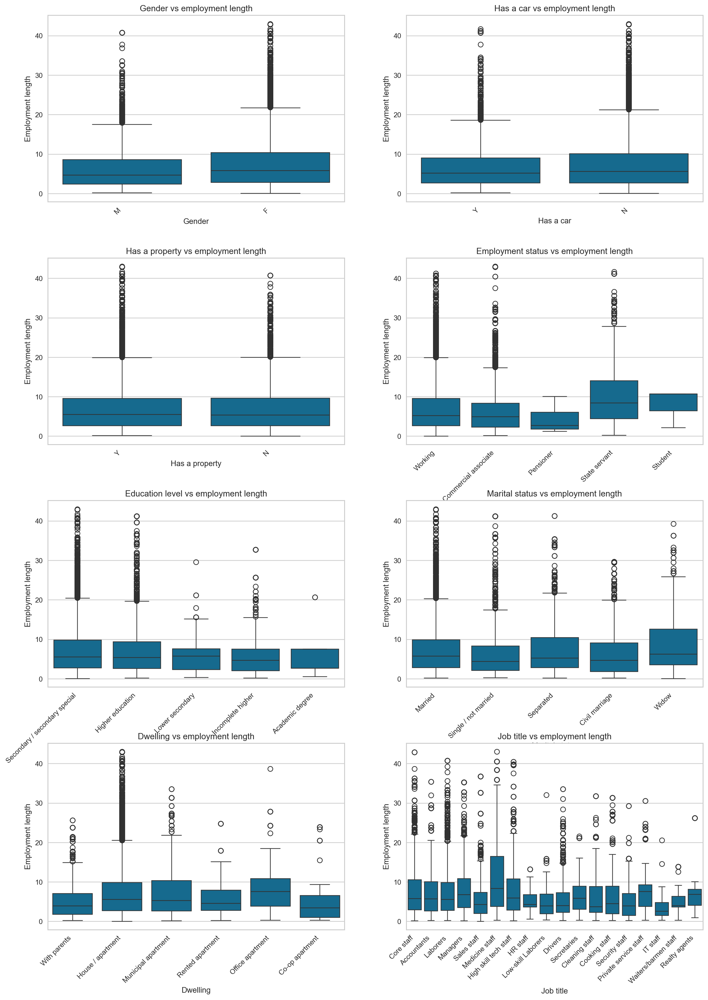

In [98]:
fig, axes = plt.subplots(4,2,figsize=(15,20),dpi=180)
fig.tight_layout(pad=5.0)

for cat_ft_count, ax in enumerate(axes):
    for row_count in range(4):
        for feat_count in range(2):
            sns.boxplot(ax=axes[row_count,feat_count],x=cc_train_copy[cat_features[cat_ft_count]],y=np.abs(cc_train_copy[cc_train_copy['Employment length'] < 0]['Employment length'])/365.25)
            axes[row_count,feat_count].set_title(cat_features[cat_ft_count] + " vs employment length")
            plt.sca(axes[row_count,feat_count])
            plt.ylabel('Employment length')
            plt.xticks(rotation=45,ha='right')
            cat_ft_count += 1
    break

Interpretation:
- Nasabah yang bekerja di sektor pemerintahan cenderung memiliki lama bekerja lebih panjang dibandingkan yang lain.
- Nasabah yang bekerja di bidang medis juga umumnya memiliki lama bekerja lebih panjang dibandingkan kelompok lainnya.

### C.4.3 Categorical vs categorical features (Chi-square test)

Hipotesisnya:

- Hipotesis nol (H₀): Kategori-kategori dari fitur tersebut tidak berpengaruh terhadap variabel target.
- Hipotesis alternatif (H₁): Satu atau lebih kategori dari fitur tersebut memiliki pengaruh yang signifikan terhadap variabel target.

In [99]:
def chi_func(feature):
    # selection row with high risk
    high_risk_ft = cc_train_copy[cc_train_copy['Is high risk'] == 1][feature]
    high_risk_ft_ct = pd.crosstab(index=high_risk_ft, columns=['Count']).rename_axis(None, axis=1)
    # drop the index feature name
    high_risk_ft_ct.index.name = None
    # observe values
    obs = high_risk_ft_ct
    print('Observed values:\n')
    print(obs)
    print('\n')
    # expected values
    print(obs.index)
    exp = pd.DataFrame([obs['Count'].sum()/len(obs)] * len(obs.index),columns=['Count'], index=obs.index)
    print('Expected values:\n')
    print(exp)
    print('\n')
    # chi-square test
    chi_squared_stat = (((obs-exp)**2)/exp).sum()
    print('Chi-square:\n')
    print(chi_squared_stat[0])
    print('\n')
    #critical value
    crit = stats.chi2.ppf(q = 0.95, df = len(obs) - 1)
    print('Critical value:\n')
    print(crit)
    print('\n')
    # p-value
    p_value = 1 - stats.chi2.cdf(x = chi_squared_stat, df = len(obs) - 1)
    print('P-value:\n')
    print(p_value)
    print('\n')
    if chi_squared_stat[0] >= crit:
        print('Reject the null hypothesis')
    elif chi_squared_stat[0] <= crit:
        print('Fail to reject the null hypothesis')

In [100]:
cat_ft = ['Gender', 'Has a car', 'Has a property', 'Employment status', 'Education level', 'Marital status', 'Dwelling', 'Job title']
for ft in cat_ft:
    print('\n\n**** {} ****\n'.format(ft))
    chi_func(ft)



**** Gender ****

Observed values:

   Count
F    306
M    193


Index(['F', 'M'], dtype='object')
Expected values:

   Count
F 249.50
M 249.50


Chi-square:

25.589178356713425


Critical value:

3.841458820694124


P-value:

[4.22401699e-07]


Reject the null hypothesis


**** Has a car ****

Observed values:

   Count
N    317
Y    182


Index(['N', 'Y'], dtype='object')
Expected values:

   Count
N 249.50
Y 249.50


Chi-square:

36.523046092184366


Critical value:

3.841458820694124


P-value:

[1.50871859e-09]


Reject the null hypothesis


**** Has a property ****

Observed values:

   Count
N    210
Y    289


Index(['N', 'Y'], dtype='object')
Expected values:

   Count
N 249.50
Y 249.50


Chi-square:

12.507014028056112


Critical value:

3.841458820694124


P-value:

[0.00040543]


Reject the null hypothesis


**** Employment status ****

Observed values:

                      Count
Commercial associate    114
Pensioner               103
State servant            28
Working

## C.5 Business findings from the EDA

Interpretasinya:

- Profil tipikal nasabah: Nasabah perempuan berusia awal 40-an, menikah, tanpa anak. Dia telah bekerja selama 5 tahun dengan pendapatan sekitar 157.500. Pendidikan terakhirnya adalah menengah. Nasabah ini tidak memiliki mobil tetapi memiliki properti (rumah/apartemen). Akunnya berusia sekitar 26 bulan.
- Usia dan pendapatan tidak memiliki pengaruh terhadap variabel target.
- Nasabah yang ditandai sebagai klien bermasalah cenderung memiliki lama bekerja lebih pendek dan akun yang lebih tua. Kelompok ini juga hanya kurang dari 2% dari total nasabah.
- Sebagian besar nasabah berusia antara 20 hingga 45 tahun dan memiliki akun berusia 25 bulan atau kurang.

# D. Prepare the data

## D.1 Transform to be done on each feature

ID:
* Drop the feature

Gender:
* One hot encoding

Age:
* Min-max scaling
* Fix skewness
* Abs value and div 365.25

Marital status:
* One hot encoding

Family member count
* Fix outliers

Children count
* Fix outliers
* Drop feature

Dwelling type
* One hot encoding

Income
* Remove outliers
* Fix skewness
* Min-max scaling

Job title
* One hot encoding
* Impute missing values

Employment status:
* One hot encoding

Education level:
* Ordinal encoding

Employment length:
* Remove outliers
* Min-max scaling
* Abs value and div 365.25
* change days of employments of retirees to 0

Has a car:
* Change it numerical
* One-hot encoding

Has a property:
* Change it numerical
* One-hot encoding

Has a mobile phone:
* Drop feature

Has a work phone:
* One-hot encoding

Has a phone:
* One-hot encoding

Has an email:
* One-hot encoding

Account age:
* Drop feature

Is high risk(Target):
* Change the data type to numerical
* balance the data with SMOTE

## D.2 Data Cleaning

### D.2.1 Outliers handling

In [101]:
class OutlierRemover(BaseEstimator, TransformerMixin):
    def __init__(self,feat_with_outliers = ['Family member count','Income', 'Employment length']):
        self.feat_with_outliers = feat_with_outliers
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.feat_with_outliers).issubset(df.columns)):
            # 25% quantile
            Q1 = df[self.feat_with_outliers].quantile(.25)
            # 75% quantile
            Q3 = df[self.feat_with_outliers].quantile(.75)
            IQR = Q3 - Q1
            # keep the data within 3 IQR
            df = df[~((df[self.feat_with_outliers] < (Q1 - 3 * IQR)) |(df[self.feat_with_outliers] > (Q3 + 3 * IQR))).any(axis=1)]
            return df
        else:
            print("One or more features are not in the dataframe")
            return df

## D.3 Feature selection

### D.3.1 Drop features

In [102]:
class DropFeatures(BaseEstimator,TransformerMixin):
    def __init__(self,feature_to_drop = ['ID','Has a mobile phone','Children count','Job title','Account age']):
        self.feature_to_drop = feature_to_drop
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.feature_to_drop).issubset(df.columns)):
            df.drop(self.feature_to_drop,axis=1,inplace=True)
            return df
        else:
            print("One or more features are not in the dataframe")
            return df

**Alasannya fitur-fitur ini dihapus:**

- **ID**: ID tidak berguna untuk prediksi. Fitur ini hanya membantu saat menggabungkan dua dataset, setelah itu tidak diperlukan lagi.
- **Has a mobile phone**: Karena semua nasabah memiliki telepon seluler, fitur ini tidak memberikan informasi tambahan.
- **Children count**: Sangat berkorelasi dengan jumlah anggota keluarga. Untuk menghindari multikolinearitas, fitur ini dihapus.
- **Job title**: Memiliki beberapa nilai yang hilang, dan distribusi kategori tidak cukup berbeda sehingga penggunaan modus tidak tepat. Oleh karena itu, fitur ini dihapus.
- **Account age**: Fitur ini digunakan untuk membuat target, sehingga jika digunakan lagi bisa menyebabkan overfitting. Selain itu, informasi ini tidak diketahui saat seseorang mengajukan kartu kredit.

## D.4 Feature engineering

### D.4.1 Time conversion


In [103]:
class TimeConversionHandler(BaseEstimator, TransformerMixin):
    def __init__(self, feat_with_days = ['Employment length', 'Age']):
        self.feat_with_days = feat_with_days
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        if (set(self.feat_with_days).issubset(X.columns)):
            # convert days to absolute value
            X[['Employment length','Age']] = np.abs(X[['Employment length','Age']])
            return X
        else:
            print("One or more features are not in the dataframe")
            return X

### D.4.2 Retiree handling (in the employment length feature)

In [104]:
class RetireeHandler(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    def fit(self, df):
        return self
    def transform(self, df):
        if 'Employment length' in df.columns:
            # select rows with employment length is 365243 which corresponds to retirees
            df_ret_idx = df['Employment length'][df['Employment length'] == 365243].index
            # change 365243 to 0
            df.loc[df_ret_idx,'Employment length'] = 0
            return df
        else:
            print("Employment length is not in the dataframe")
            return df

### D.4.3 Skewness handling

In [105]:
class SkewnessHandler(BaseEstimator, TransformerMixin):
    def __init__(self,feat_with_skewness=['Income','Age']):
        self.feat_with_skewness = feat_with_skewness
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.feat_with_skewness).issubset(df.columns)):
            # Handle skewness with cubic root transformation
            df[self.feat_with_skewness] = np.cbrt(df[self.feat_with_skewness])
            return df
        else:
            print("One or more features are not in the dataframe")
            return df

### D.4.4 Binning

In [106]:
class BinningNumToYN(BaseEstimator, TransformerMixin):
    def __init__(self,feat_with_num_enc=['Has a work phone','Has a phone','Has an email']):
        self.feat_with_num_enc = feat_with_num_enc
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.feat_with_num_enc).issubset(df.columns)):
            # Change 0 to N and 1 to Y for all the features in feat_with_num_enc
            for ft in self.feat_with_num_enc:
                df[ft] = df[ft].map({1:'Y',0:'N'})
            return df
        else:
            print("One or more features are not in the dataframe")
            return df

### D.4.5 One hot encoding (with feature's name)

In [107]:
class OneHotWithFeatNames(BaseEstimator,TransformerMixin):
    def __init__(self,one_hot_enc_ft = ['Gender', 'Marital status', 'Dwelling', 'Employment status', 'Has a car', 'Has a property', 'Has a work phone', 'Has a phone', 'Has an email']):
        self.one_hot_enc_ft = one_hot_enc_ft
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.one_hot_enc_ft).issubset(df.columns)):
            # function to one hot encode the features in one_hot_enc_ft
            def one_hot_enc(df,one_hot_enc_ft):
                one_hot_enc = OneHotEncoder()
                one_hot_enc.fit(df[one_hot_enc_ft])
                # get the result of the one hot encoding columns names
                feat_names_one_hot_enc = one_hot_enc.get_feature_names_out(one_hot_enc_ft)
                # change the array of the one hot encoding to a dataframe with the column names
                df = pd.DataFrame(one_hot_enc.transform(df[self.one_hot_enc_ft]).toarray(),columns=feat_names_one_hot_enc,index=df.index)
                return df
            # function to concatenat the one hot encoded features with the rest of features that were not encoded
            def concat_with_rest(df,one_hot_enc_df,one_hot_enc_ft):
                # get the rest of the features
                rest_of_features = [ft for ft in df.columns if ft not in one_hot_enc_ft]
                # concatenate the rest of the features with the one hot encoded features
                df_concat = pd.concat([one_hot_enc_df, df[rest_of_features]],axis=1)
                return df_concat
            # one hot encoded dataframe
            one_hot_enc_df = one_hot_enc(df,self.one_hot_enc_ft)
            # returns the concatenated dataframe
            full_df_one_hot_enc = concat_with_rest(df,one_hot_enc_df,self.one_hot_enc_ft)
            return full_df_one_hot_enc
        else:
            print("One or more features are not in the dataframe")
            return df

### D.4.6 Ordinal encoding (with feature's names)

In [108]:
class OrdinalFeatNames(BaseEstimator,TransformerMixin):
    def __init__(self,ordinal_enc_ft = ['Education level']):
        self.ordinal_enc_ft = ordinal_enc_ft
    def fit(self,df):
        return self
    def transform(self,df):
        if 'Education level' in df.columns:
            ordinal_enc = OrdinalEncoder()
            df[self.ordinal_enc_ft] = ordinal_enc.fit_transform(df[self.ordinal_enc_ft])
            return df
        else:
            print("Education level is not in the dataframe")
            return df

### D.4.7 Min-Max scaling (with feature's names)

In [109]:
class MinMaxWithFeatNames(BaseEstimator,TransformerMixin):
    def __init__(self,min_max_scaler_ft = ['Age', 'Income', 'Employment length']):
        self.min_max_scaler_ft = min_max_scaler_ft
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.min_max_scaler_ft).issubset(df.columns)):
            min_max_enc = MinMaxScaler()
            df[self.min_max_scaler_ft] = min_max_enc.fit_transform(df[self.min_max_scaler_ft])
            return df
        else:
            print("One or more features are not in the dataframe")
            return df

### D.4.8 Change the data types of the target feature

In [110]:
class ChangeToNumTarget(BaseEstimator,TransformerMixin):
    def __init__(self):
        pass
    def fit(self,df):
        return self
    def transform(self,df):
        if 'Is high risk' in df.columns:
            df['Is high risk'] = pd.to_numeric(df['Is high risk'])
            return df
        else:
            print("Is high risk is not in the dataframe")
            return df

### D.4.9 Oversampling

In [111]:
class Oversample(BaseEstimator,TransformerMixin):
    def __init__(self):
        pass
    def fit(self,df):
        return self
    def transform(self,df):
        if 'Is high risk' in df.columns:
            # smote function to oversample the minority class to fix the imbalance data
            oversample = SMOTE(sampling_strategy='minority')
            X_bal, y_bal = oversample.fit_resample(df.loc[:, df.columns != 'Is high risk'],df['Is high risk'])
            df_bal = pd.concat([pd.DataFrame(X_bal),pd.DataFrame(y_bal)],axis=1)
            return df_bal
        else:
            print("Is high risk is not in the dataframe")
            return df

Kita menggunakan SMOTE untuk melakukan oversampling karena kelas minoritas (nasabah berisiko tinggi, Is high risk = 1) sangat jarang muncul dalam data.

## D.5 Data Preprocessing

In [112]:
def full_pipeline(df):
    # Create the pipeline that will call all the class from OutlierRemoval to OversampleSMOTE in one go
    pipeline = Pipeline([
        ('outlier_remover', OutlierRemover()),
        ('feature_dropper', DropFeatures()),
        ('time_conversion_handler', TimeConversionHandler()),
        ('retiree_handler', RetireeHandler()),
        ('skewness_handler', SkewnessHandler()),
        ('binning_num_to_yn', BinningNumToYN()),
        ('one_hot_with_feat_names', OneHotWithFeatNames()),
        ('ordinal_feat_names', OrdinalFeatNames()),
        ('min_max_with_feat_names', MinMaxWithFeatNames()),
        ('change_to_num_target', ChangeToNumTarget()),
        ('oversample', Oversample())
    ])
    df_pipe_prep = pipeline.fit_transform(df)
    return df_pipe_prep

In [113]:
pd.options.mode.chained_assignment = None  # Hide the copy warning
cc_train_prep = full_pipeline(cc_train_copy)

In [114]:
cc_train_prep.shape

(46544, 34)

In [115]:
pd.set_option('display.max_columns', None)
cc_train_prep.head()

,Gender_F,Gender_M,Marital status_Civil marriage,Marital status_Married,Marital status_Separated,Marital status_Single / not married,Marital status_Widow,Dwelling_Co-op apartment,Dwelling_House / apartment,Dwelling_Municipal apartment,Dwelling_Office apartment,Dwelling_Rented apartment,Dwelling_With parents,Employment status_Commercial associate,Employment status_Pensioner,Employment status_State servant,Employment status_Student,Employment status_Working,Has a car_N,Has a car_Y,Has a property_N,Has a property_Y,Has a work phone_N,Has a work phone_Y,Has a phone_N,Has a phone_Y,Has an email_N,Has an email_Y,Income,Education level,Age,Employment length,Family member count,Is high risk
0,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,1.00,1.00,0.00,1.00,0.00,1.00,0.00,0.42,4.00,0.60,0.27,2.00,0
1,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,1.00,0.00,1.00,0.00,1.00,0.00,0.42,1.00,0.20,0.14,2.00,0
2,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,1.00,0.00,1.00,0.00,1.00,0.00,0.52,4.00,0.39,0.50,4.00,0
3,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,1.00,0.00,1.00,0.00,0.00,1.00,0.81,1.00,0.84,0.18,1.00,0
4,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00,1.00,0.00,0.68,4.00,0.60,0.04,1.00,0


In [116]:
# split the train data into X and y (target)
X_cc_train_prep, y_cc_train_prep = cc_train_prep.loc[:, cc_train_prep.columns != 'Is high risk'], cc_train_prep['Is high risk'].astype('int64')

# E. Short-list promising models

## E.1 Models training

In [117]:
classifiers = {
    'logistic_regression':LogisticRegression(random_state=42,max_iter=1000),
    'decision_tree':DecisionTreeClassifier(random_state=42),
    'random_forest':RandomForestClassifier(random_state=42),
    'k_nearest_neighbors':KNeighborsClassifier(),
    'gradient_boosting':GradientBoostingClassifier(random_state=42),
    'xgboost': XGBClassifier(random_state=42)
    }

In [130]:
def folder_check_model(model_name, final_model=False):
    folder_path = Path(f"saved_models_final/{model_name}" if final_model else f"saved_models/{model_name}")
    folder_path.mkdir(parents=True, exist_ok=True)

In [131]:
def roc_curve_func(model_trn, model_name, final_model=False):
    y_train = y_cc_train_prep
    X_train = X_cc_train_prep
    
    if not hasattr(model_trn, "predict_proba"):
        print(f"No ROC curve for {model_name} (predict_proba not available)\n")
        return
    
    # ambil probabilitas kelas positif
    y_prob = model_trn.predict_proba(X_train)[:,1]
    fpr, tpr, _ = roc_curve(y_train, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0,1], [0,1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {model_name}')
    plt.legend(loc='lower right')
    plt.show()
    print("\n")

In [133]:
def feat_importance_plot(model_trn, model_name):
    X_train = X_cc_train_prep
    feature_names = X_train.columns if hasattr(X_train, "columns") else [f"f{i}" for i in range(X_train.shape[1])]
    
    if hasattr(model_trn, "feature_importances_"):
        importances = model_trn.feature_importances_
    elif hasattr(model_trn, "coef_"):
        importances = np.abs(model_trn.coef_).ravel()
    else:
        print(f"No feature importance for {model_name}\n")
        return
    
    # sort fitur
    indices = np.argsort(importances)
    
    # plot top 10
    plt.figure(figsize=(10,4))
    plt.barh([feature_names[i] for i in indices[-10:]], importances[indices[-10:]])
    plt.xlabel("Importance")
    plt.title(f"Top 10 Features - {model_name}")
    plt.show()
    
    # plot bottom 10
    plt.figure(figsize=(10,4))
    plt.barh([feature_names[i] for i in indices[:10]], importances[indices[:10]])
    plt.xlabel("Importance")
    plt.title(f"Bottom 10 Features - {model_name}")
    plt.show()
    print("\n")

In [134]:
def confusion_matrix_func(model_trn, model_name):
    y_pred = cross_val_predict(model_trn, X_cc_train_prep, y_cc_train_prep, cv=10, n_jobs=-1)
    fig, ax = plt.subplots(figsize=(8,8))
    ConfusionMatrixDisplay.from_predictions(y_cc_train_prep, y_pred, ax=ax, cmap='Blues', values_format='d')
    plt.xlabel("Predicted Label", fontsize=14)
    plt.ylabel("True Label", fontsize=14)
    plt.title(f"Confusion Matrix - {model_name}", fontsize=14)
    plt.show()
    print("\n")

In [135]:
def score_func(model_trn, model_name):
    y_pred = cross_val_predict(model_trn, X_cc_train_prep, y_cc_train_prep, cv=10, n_jobs=-1)
    print(classification_report(y_cc_train_prep, y_pred))

In [136]:
def train_model(model, model_name, final_model=False):
    folder_check_model(model_name, final_model)
    model_file = Path(f"saved_models_final/{model_name}/{model_name}_model.sav" if final_model else f"saved_models/{model_name}/{model_name}_model.sav")
    
    if model_file.exists():
        model_trn = joblib.load(model_file)
    else:
        model_trn = model.fit(X_cc_train_prep, y_cc_train_prep)
        joblib.dump(model_trn, model_file)
    
    return model_trn



-------------  logistic_regression  --------------

              precision    recall  f1-score   support

           0       0.58      0.56      0.57     23272
           1       0.58      0.60      0.59     23272

    accuracy                           0.58     46544
   macro avg       0.58      0.58      0.58     46544
weighted avg       0.58      0.58      0.58     46544



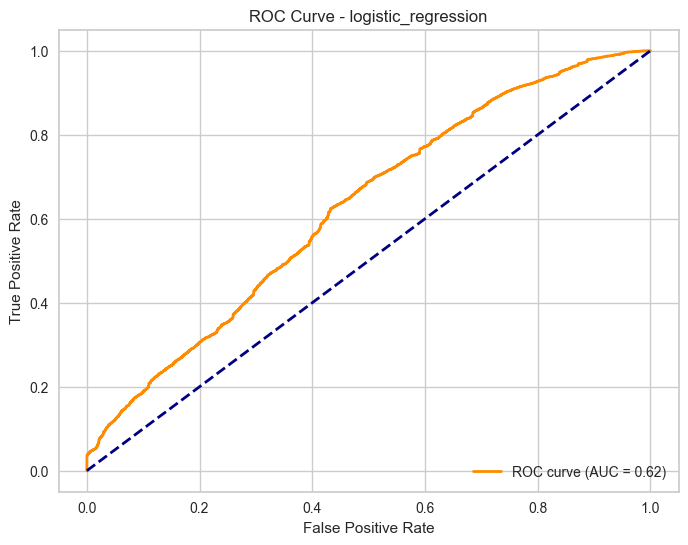

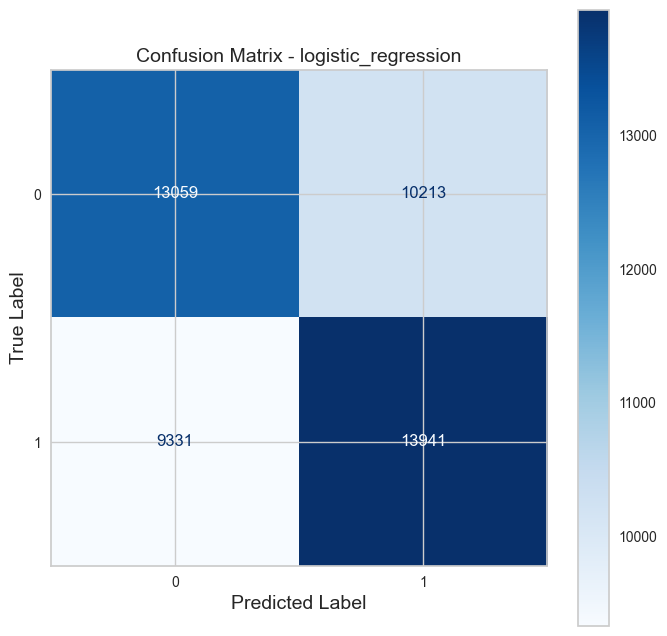

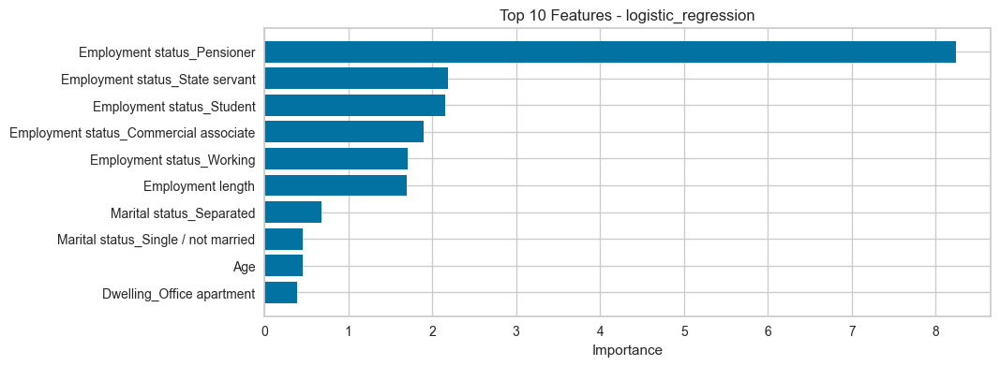

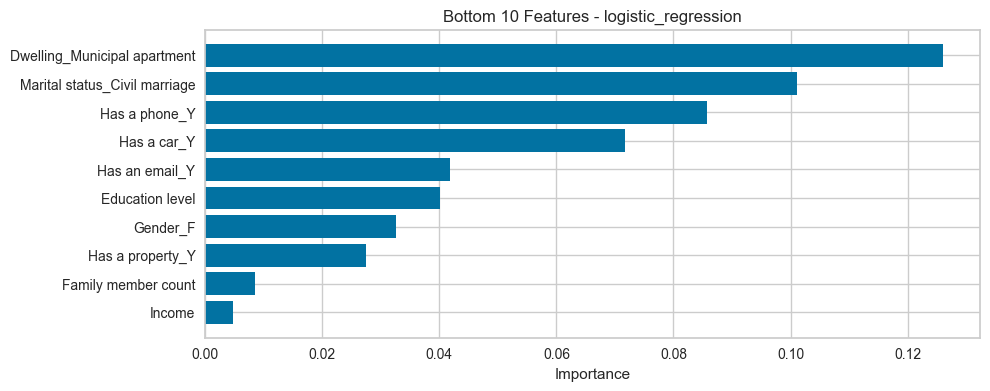





----------------  decision_tree  -----------------

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     23272
           1       0.98      0.98      0.98     23272

    accuracy                           0.98     46544
   macro avg       0.98      0.98      0.98     46544
weighted avg       0.98      0.98      0.98     46544



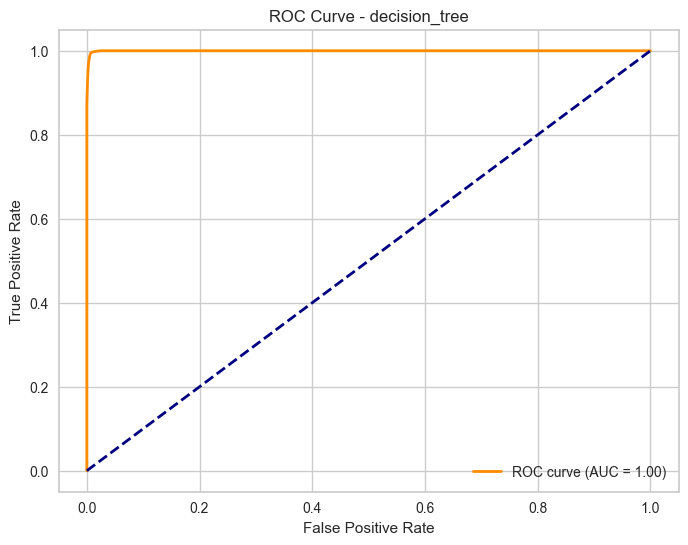

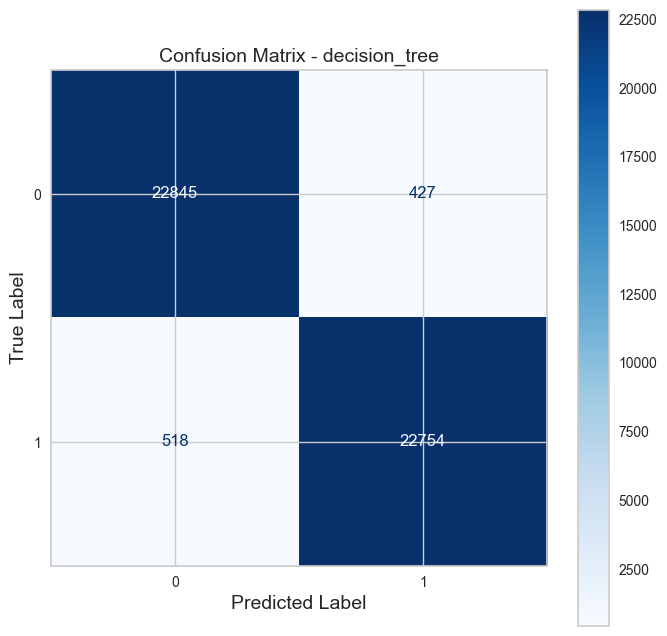

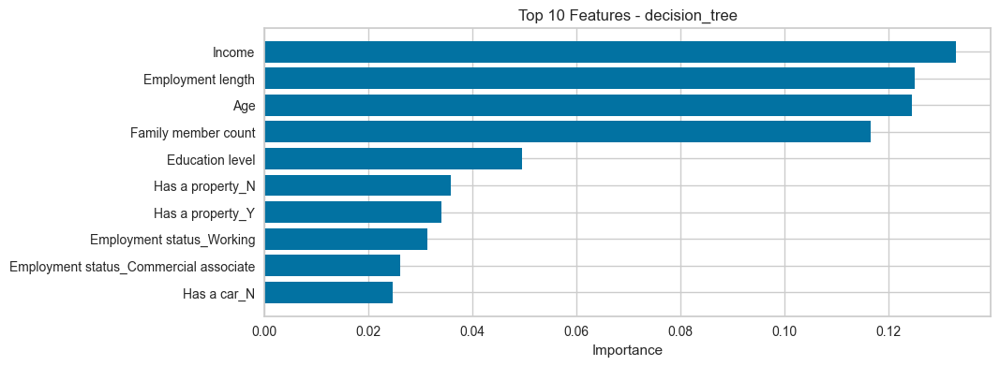

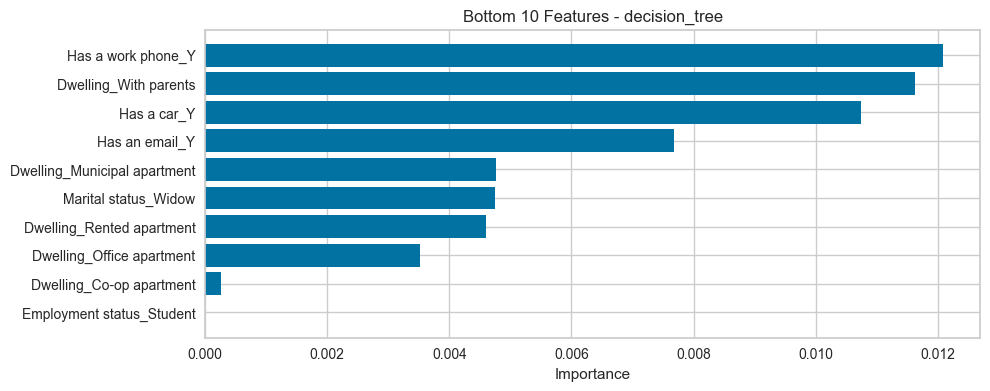





----------------  random_forest  -----------------

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     23272
           1       0.99      0.99      0.99     23272

    accuracy                           0.99     46544
   macro avg       0.99      0.99      0.99     46544
weighted avg       0.99      0.99      0.99     46544



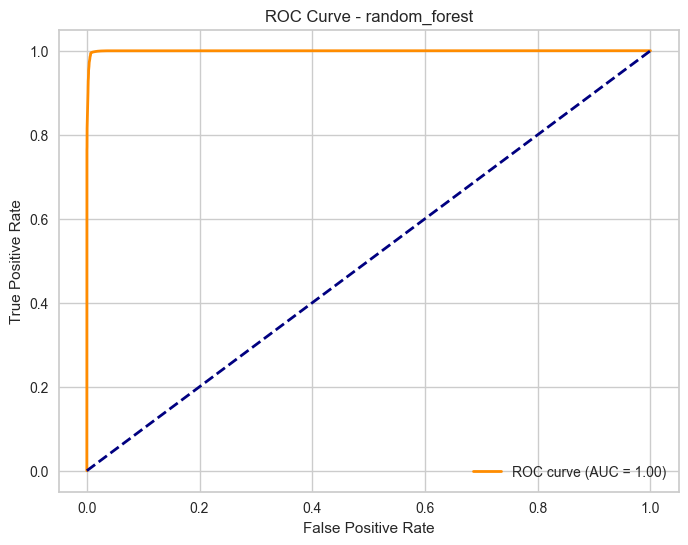

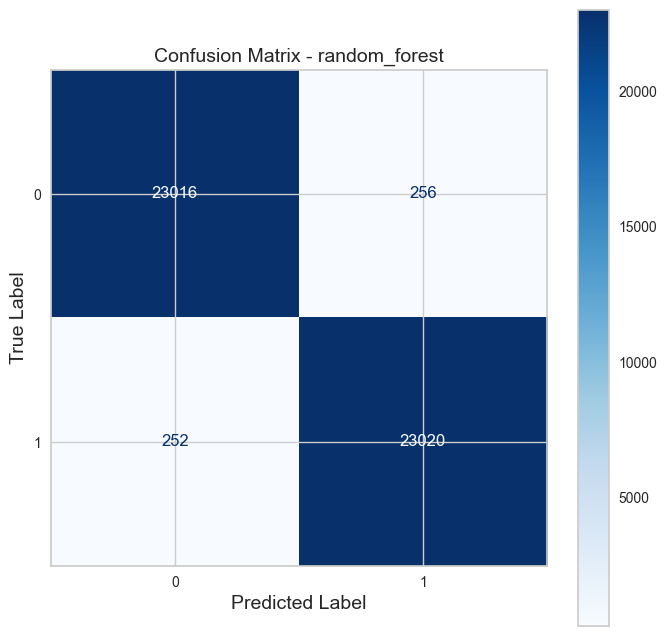

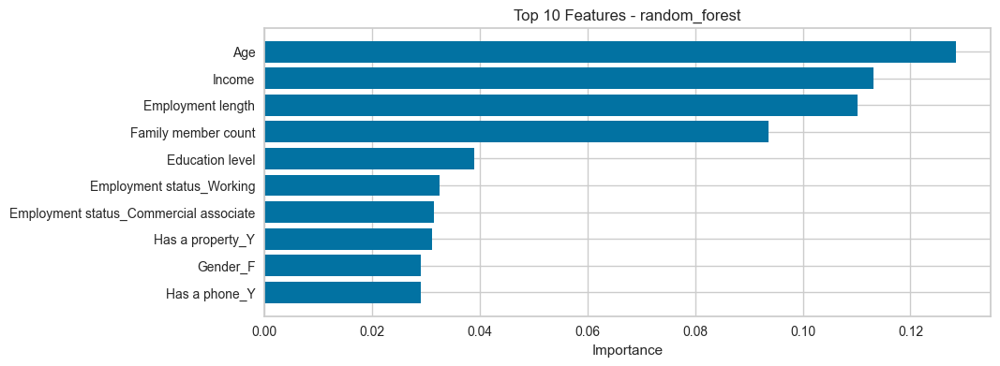

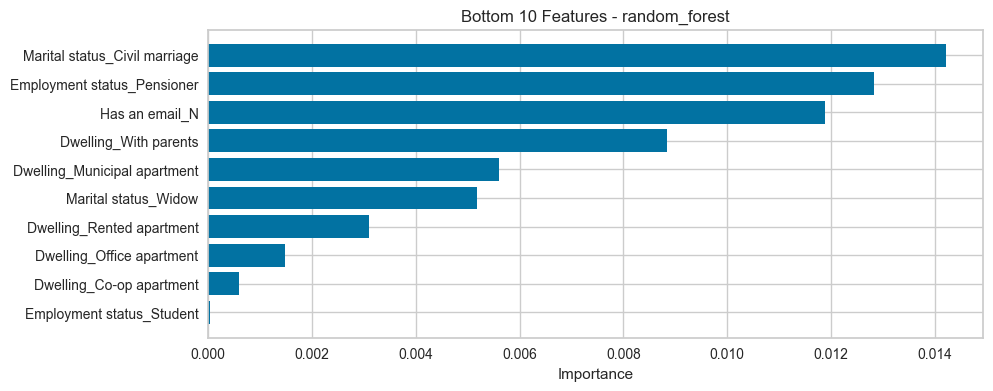





-------------  k_nearest_neighbors  --------------

              precision    recall  f1-score   support

           0       0.93      0.96      0.95     23272
           1       0.96      0.93      0.94     23272

    accuracy                           0.94     46544
   macro avg       0.95      0.94      0.94     46544
weighted avg       0.95      0.94      0.94     46544



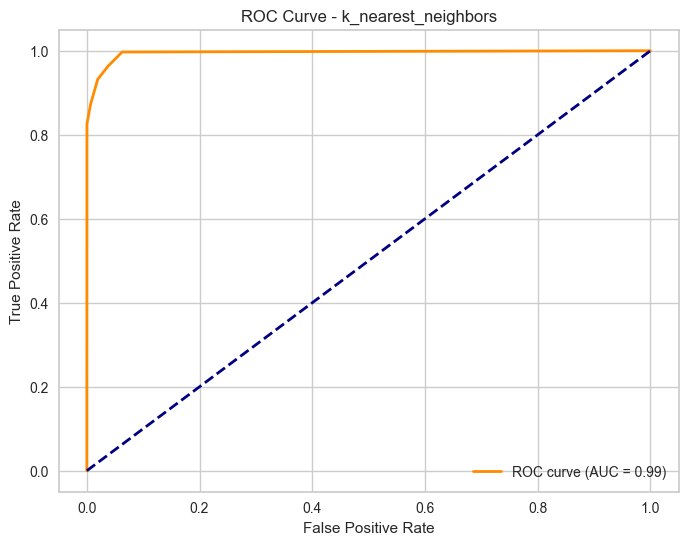

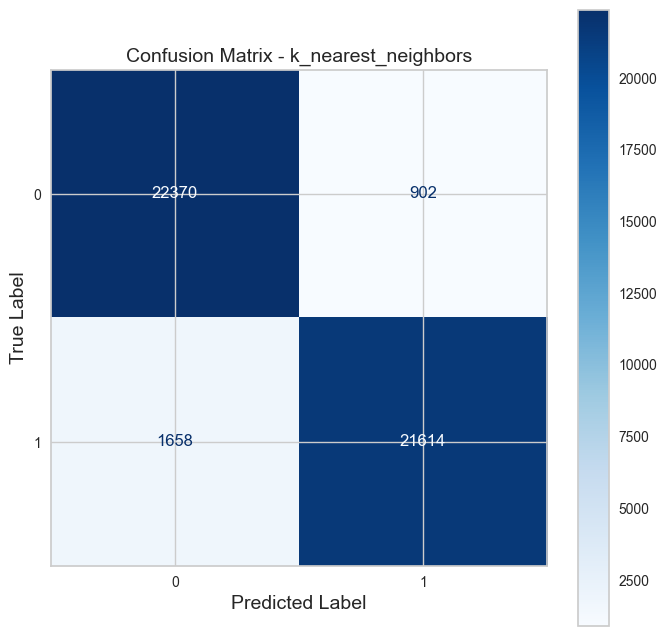



No feature importance for k_nearest_neighbors



--------------  gradient_boosting  ---------------

              precision    recall  f1-score   support

           0       0.90      0.90      0.90     23272
           1       0.90      0.90      0.90     23272

    accuracy                           0.90     46544
   macro avg       0.90      0.90      0.90     46544
weighted avg       0.90      0.90      0.90     46544



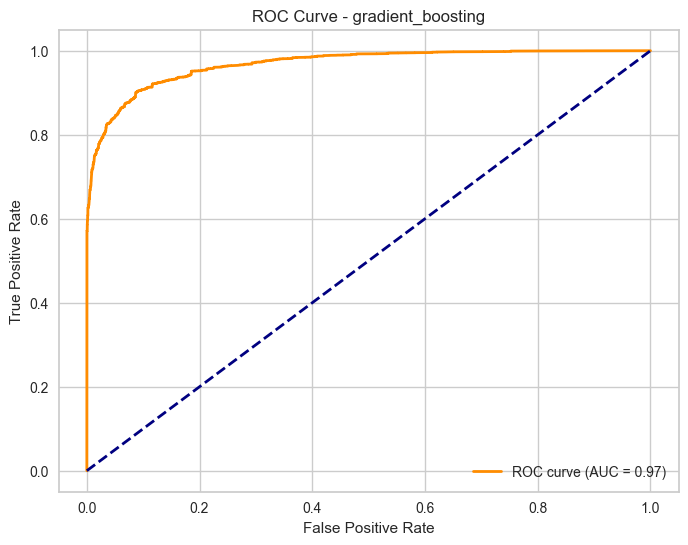

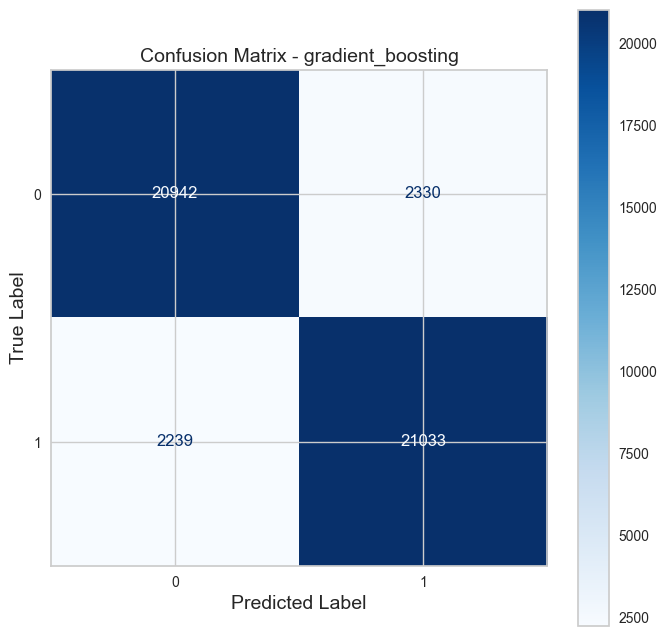

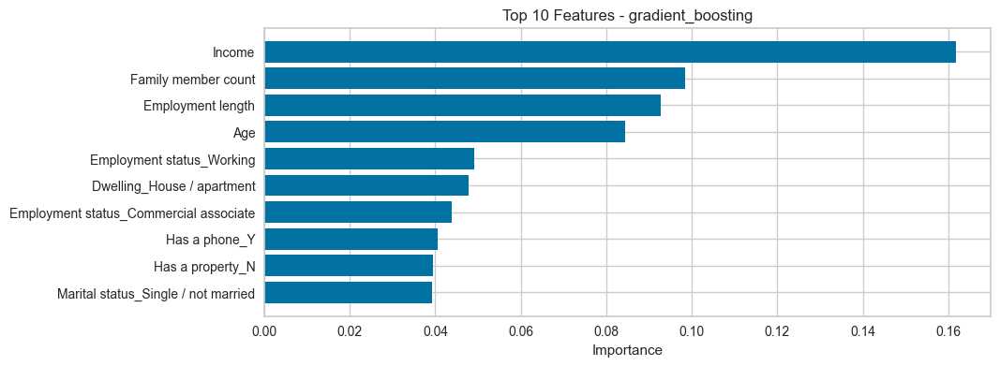

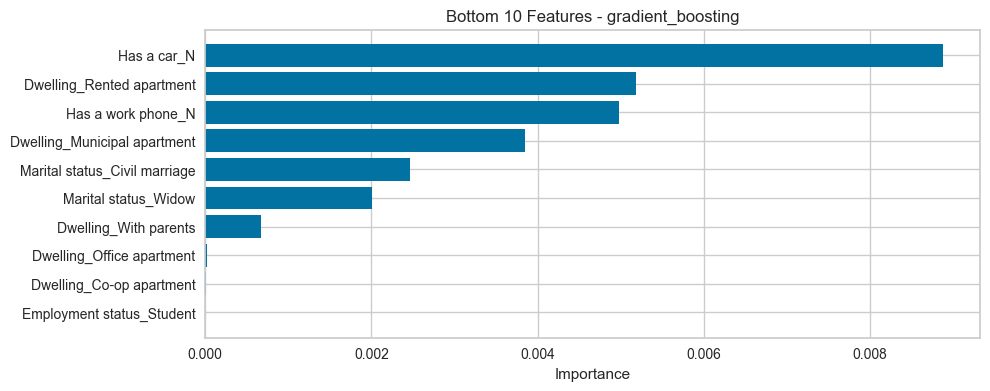





-------------------  xgboost  --------------------

              precision    recall  f1-score   support

           0       0.98      0.99      0.99     23272
           1       0.99      0.98      0.99     23272

    accuracy                           0.99     46544
   macro avg       0.99      0.99      0.99     46544
weighted avg       0.99      0.99      0.99     46544



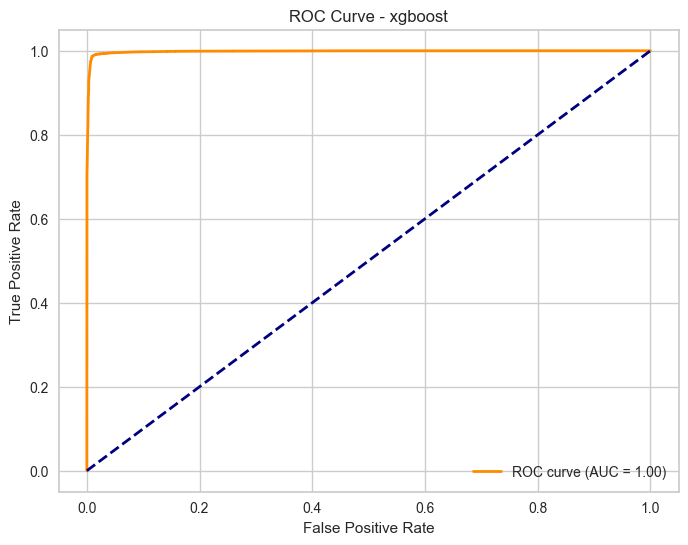

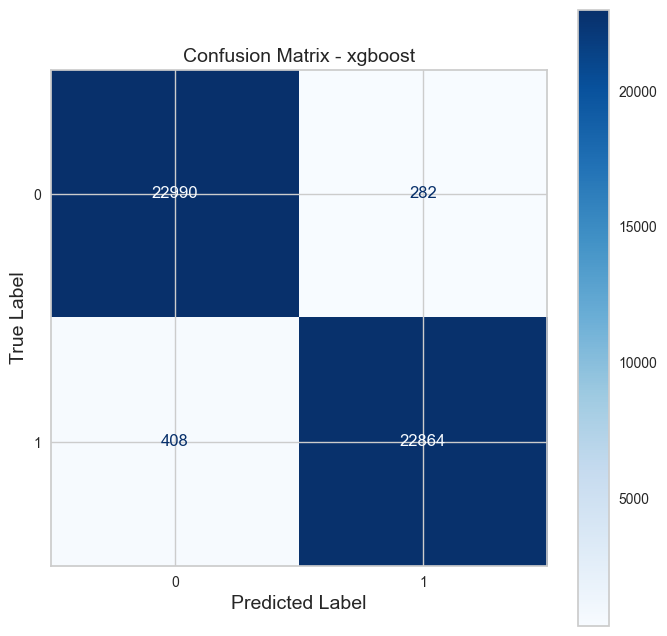

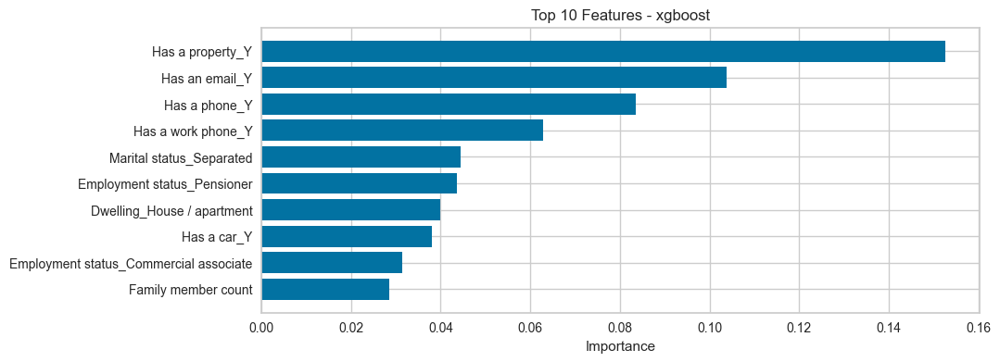

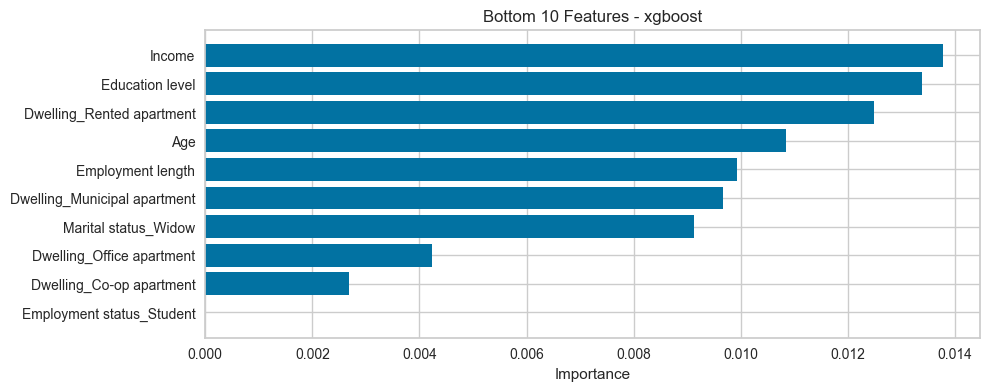

In [137]:
for model_name, model in classifiers.items():
    print('\n\n' + f'  {model_name}  '.center(50,'-') + '\n')
    
    # train / load model
    model_trn = train_model(model, model_name)
    
    # classification report
    score_func(model_trn, model_name)
    
    # ROC curve
    roc_curve_func(model_trn, model_name)
    
    # confusion matrix
    confusion_matrix_func(model_trn, model_name)
    
    # feature importance
    feat_importance_plot(model_trn, model_name)

## E.2 What metrics to use for this problem?

Karena tujuan dari masalah ini adalah **meminimalkan risiko gagal bayar kredit** bagi lembaga keuangan, metrik yang digunakan bergantung pada kondisi ekonomi saat ini:

**Saat pasar sedang berkembang:**
Orang cenderung merasa kaya, banyak yang bekerja, dan uang relatif murah. Risiko gagal bayar rendah. Lembaga keuangan dapat menangani beberapa nasabah bermasalah selama mayoritas nasabah membayar kembali kredit mereka. Dalam kondisi ini, **recall (sensitivitas) yang tinggi** sangat ideal, agar sebagian besar nasabah berisiko tinggi tetap terdeteksi.

**Saat pasar sedang menurun:**
Banyak orang kehilangan pekerjaan dan uang, misalnya melalui pasar saham. Banyak orang kesulitan memenuhi kewajiban finansialnya. Lembaga keuangan cenderung lebih konservatif dalam memberikan kredit. Mereka lebih memilih memiliki sedikit nasabah baik daripada menanggung risiko nasabah yang gagal bayar. Dalam kondisi ini, **precision (spesifisitas) yang tinggi lebih diutamakan**, agar nasabah buruk tidak lolos dari deteksi.

**Catatan:** Selalu ada **trade-off antara precision dan recall.** Pemilihan metrik harus disesuaikan dengan tujuan bisnis dan kondisi ekonomi.

**Kesimpulan**: Karena saat ini kita berada di pasar berkembang , **recall akan digunakan sebagai metrik utama.**

## E.3 Top model

**Rekomendasi Pilihan Model**
Berdasarkan analisis di atas:

**1. Model Gradient Boosting**
Alasan Utama: Model Gradient Boosting memiliki metrik performa yang sangat baik (ROC 0.97) dan **Feature Importance yang lebih masuk akal** secara bisnis/statistik. Fitur-fitur seperti Pendapatan dan Lama Bekerja adalah prediktor yang solid dan dapat diinterpretasikan.

**2. Model XGBoost**
Alasan Utama: Meskipun metriknya hampir sempurna (ROC 1.00), ini adalah **red flag.**

Overfitting: ROC AUC 1.00 hampir pasti menunjukkan model overfit pada data latih dan kemungkinan akan berkinerja buruk pada data baru di dunia nyata.

Data Leakage: Ada kemungkinan kebocoran data di mana fitur Has a property_Y secara langsung atau tidak langsung terkait dengan variabel target.

**Kesimpulan Akhir:**
**Pilih Gradient Boosting. Metriknya kuat dan Feature Importance-nya dapat dipercaya, menjadikannya model yang lebih andal dan dapat diinterpretasikan untuk produksi.**

# F. Test the final model on the test set

In [154]:
cc_test_copy.head(5)

,ID,Gender,Has a car,Has a property,Children count,Income,Employment status,Education level,Marital status,Dwelling,Age,Employment length,Has a mobile phone,Has a work phone,Has a phone,Has an email,Job title,Family member count,Account age,Is high risk
0,5091261,F,N,Y,0,202500.00,State servant,Secondary / secondary special,Separated,House / apartment,-16834,-1692,1,0,0,0,Medicine staff,1.00,-6.00,0
1,5096963,M,Y,N,0,675000.00,Commercial associate,Higher education,Married,House / apartment,-18126,-948,1,0,1,0,Managers,2.00,-16.00,0
2,5087880,F,N,N,0,234000.00,State servant,Higher education,Civil marriage,House / apartment,-21967,-5215,1,0,0,1,Core staff,2.00,-52.00,0
3,5021949,F,Y,Y,0,445500.00,Commercial associate,Higher education,Married,House / apartment,-12477,-456,1,0,0,0,Managers,2.00,-54.00,0
4,5105705,F,Y,N,0,225000.00,Working,Secondary / secondary special,Married,Municipal apartment,-12155,-667,1,0,0,0,Laborers,2.00,-48.00,0


In [155]:
cc_test_prep = full_pipeline(cc_test_copy)

In [156]:
# split the train data into X and y (target)
X_cc_test_prep, y_cc_test_prep = cc_test_prep.loc[:, cc_test_prep.columns != 'Is high risk'], cc_test_prep['Is high risk'].astype('int64')

In [157]:
# train the model
model_trn = train_model(classifiers['gradient_boosting'],'gradient_boosting')

In [158]:
final_predictions = model_trn.predict(X_cc_test_prep)

In [159]:
final_predictions.shape

(11654,)

In [160]:
n_correct = sum(final_predictions == y_cc_test_prep)

In [176]:
# akurasi train
print(n_correct/len(final_predictions))

0.8555002574223443


In [177]:
recall_test_1 = recall_score(
    y_cc_test_prep,
    final_predictions,
    pos_label=1
)

print("Recall test (kelas 1):", recall_test_1)

Recall test (kelas 1): 0.9831817401750472


## F.2 Hyperparameter tuning for The best Model

In [166]:
param_dist = {
    'n_estimators': randint(100, 500),
    'learning_rate': uniform(0.01, 0.2),
    'max_depth': randint(3, 6),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 4),
    'subsample': uniform(0.7, 0.3),
    'max_features': ['sqrt', 'log2', None]
}

recall_scorer = make_scorer(recall_score, pos_label=1)

gbc = GradientBoostingClassifier(random_state=42)

random_search = RandomizedSearchCV(
    estimator=gbc,
    param_distributions=param_dist,
    n_iter=50,         
    scoring=recall_scorer,
    cv=3,              
    n_jobs=-1,
    verbose=2,
    random_state=42
)
random_search.fit(X_cc_train_prep, y_cc_train_prep)

best_model = random_search.best_estimator_

print("Best parameters:", random_search.best_params_)
print("Best recall (kelas 1):", random_search.best_score_)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best parameters: {'learning_rate': np.float64(0.1644489538593315), 'max_depth': 5, 'max_features': None, 'min_samples_leaf': 3, 'min_samples_split': 2, 'n_estimators': 491, 'subsample': np.float64(0.9187021504122961)}
Best recall (kelas 1): 0.9896438290915909


              precision    recall  f1-score   support

           0       0.99      0.99      0.99     23272
           1       0.99      0.99      0.99     23272

    accuracy                           0.99     46544
   macro avg       0.99      0.99      0.99     46544
weighted avg       0.99      0.99      0.99     46544



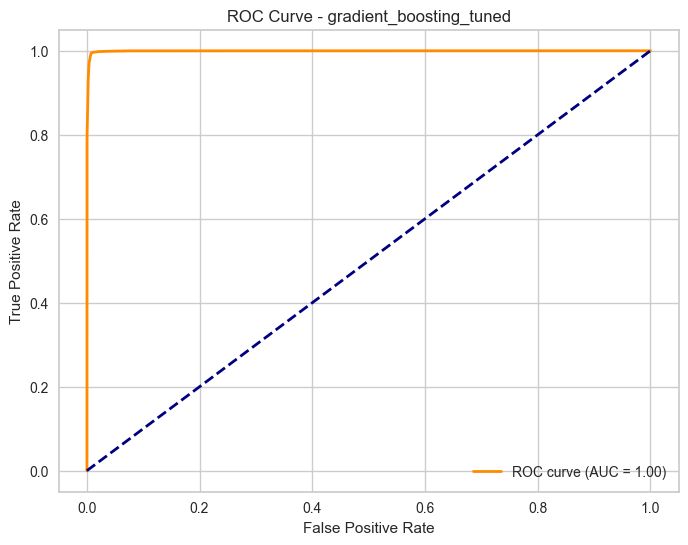

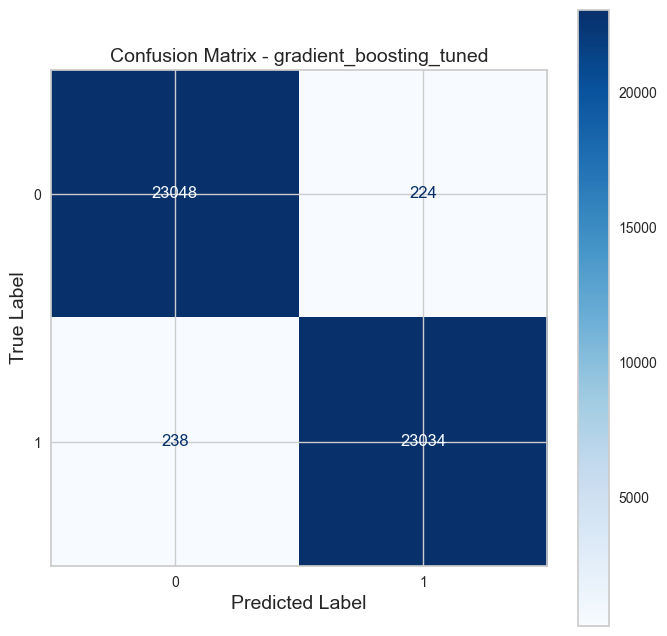

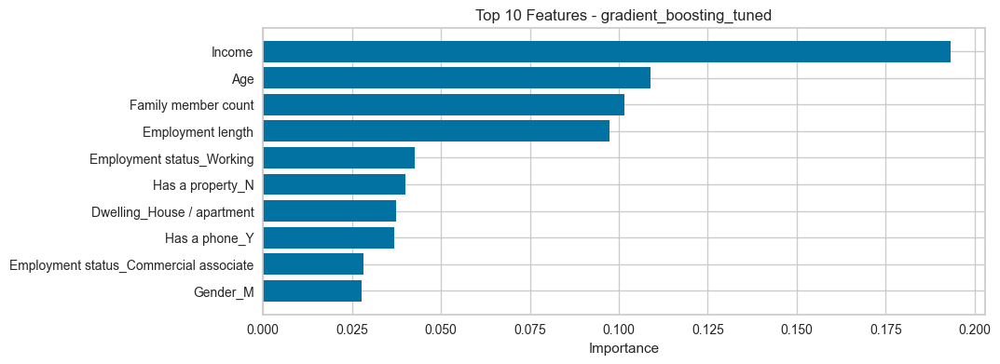

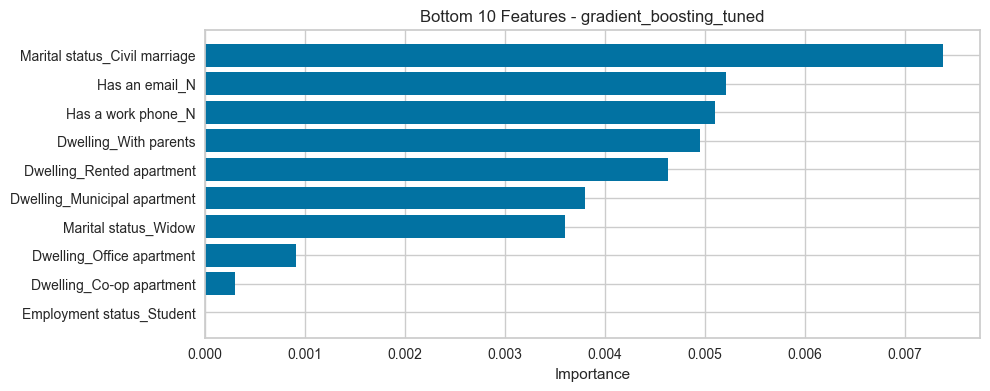

In [167]:
# classification report
score_func(best_model, "gradient_boosting_tuned")

# ROC curve
roc_curve_func(best_model, "gradient_boosting_tuned")

# confusion matrix
confusion_matrix_func(best_model, "gradient_boosting_tuned")

# feature importance
feat_importance_plot(best_model, "gradient_boosting_tuned")

In [172]:
# Prediksi pada test set menggunakan model terbaik hasil tuning
final_predictions = best_model.predict(X_cc_test_prep)

n_correct = sum(final_predictions == y_cc_test_prep)
accuracy = n_correct / len(final_predictions)

print("Akurasi pada test set (best_model):", accuracy)

Akurasi pada test set (best_model): 0.8555002574223443


In [173]:
final_predictions = best_model.predict(X_cc_test_prep)
recall_test_1 = recall_score(
    y_cc_test_prep,
    final_predictions,
    pos_label=1
)
print("Recall test (kelas 1):", recall_test_1)

Recall test (kelas 1): 0.9831817401750472


# G. Kesimpulan

Berdasarkan hasil pemodelan Gradient Boosting yang telah dilakukan hyperparameter tuning, model menunjukkan performa yang stabil dan seimbang dalam memprediksi kelayakan kredit.

- **Performa Model**

- **Recall train sebelum tuning untuk kelas 0 dan 1 sama-sama 0.90**

- **Recall train setelah tuning untuk kelas 0 dan 1 sama-sama 0.99**

- **Recall test sebelum tuning kelas 1: 0.983**

- **Best recall test atau hasil tuned kelas 1 (nasabah berisiko): 0.983**

Ini menunjukkan bahwa model sangat efektif dalam mendeteksi calon nasabah berisiko (kelas 1), yang merupakan aspek paling krusial dalam konteks bisnis kartu kredit karena:

- Mengurangi risiko default

- Meminimalkan kerugian finansial akibat salah menyetujui nasabah berisiko tinggi

**Interpretasi Feature Importance (Gradient Boosting Tuned)**

Dari hasil **feature importance**, faktor-faktor paling berpengaruh terhadap keputusan model adalah:

- **Income** (Faktor paling dominan. Pendapatan mencerminkan kemampuan finansial nasabah dalam memenuhi kewajiban pembayaran.)

- **Age** (Usia berkaitan dengan stabilitas hidup dan pengalaman finansial.)

- **Family member count** (Jumlah tanggungan memengaruhi beban finansial dan risiko gagal bayar.)

- **Employment length** (Lama bekerja menunjukkan kestabilan pekerjaan dan pendapatan.)

- **Employment status (Working / Commercial associate)** (Status pekerjaan menjadi indikator konsistensi pemasukan.)

- **Property ownership & Dwelling type** (Kepemilikan properti dan tipe hunian mencerminkan stabilitas ekonomi.)

- **Has a phone & Gender** (Faktor pendukung yang membantu diferensiasi risiko, meskipun kontribusinya lebih kecil.)